# Proyecto 03 - Series de Tiempo

#### Link para repositorio en GitHub:

https://github.com/felipejaw/proyecto_series_tiempo

## Dataset: Flujo Vehicular por Unidades de Peaje AUSA

**Recuerda descargar el dataset de [aquí](https://data.buenosaires.gob.ar/dataset/flujo-vehicular-por-unidades-peaje-ausa). Deberás descargar -  al menos para comenzar - los años 2017, 2018 y 2019.**

En este notebook te dejamos unas celdas para que puedas comenzar a trabajar con este dataset para los años 2017, 2018 y 2019. Si deseas utilizar otros años, ten en cuenta que deberás hacer el preprocesamiento correspondiente, ya que la estructura de los datos puede variar.

**Importante:** Para el proyecto, debes comenzar con los datos de la autopista Illia, pago en Efectivo.

### Exploración de datos

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿Cuáles son los días y horarios de mayor tráfico? También, estudia autocorrelaciones, resampleos, etc.

#### Componentes de la serie

1. Calcula las componentes estacionales y tendencia de la serie. Interpreta los resultados, si es necesario con información auxiliar (por fuera del dataset) o elementos del dataset que no estés utilizando (por ejemplo, si la tendencia es negativa, ¿puede ser porque se migre a otras formas de pago?).
1. ¿La serie posee valores atípicos? Si es así, interpreta, si es necesario con información auxiliar. **Pista**: primer semestre 2019.

### Predicción a Futuro

Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019. 

1. Haz todas las transformaciones de datos que consideres necesarias. Justifica.
1. Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.
1. Elige un modelo benchmark y compara tus resultados con este modelo.
1. Optimiza los hiperparámetros de tu modelo. 
1. Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?
1. Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
1. Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?
1. ¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?
1. ¿Hay algo que te gustaría investigar o probar?

### **¡Tómate tiempo para investigar y leer mucho!**

### 1. Preparación del Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

In [2]:
data_2019 = pd.read_csv('Datasets/flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('Datasets/flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('Datasets/flujo-vehicular-2017.csv', sep =',')

In [3]:
data_2019.info()
data_2019.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812153 entries, 0 to 812152
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   periodo         812153 non-null  int64 
 1   fecha           812153 non-null  object
 2   hora_inicio     812153 non-null  int64 
 3   hora_fin        812153 non-null  int64 
 4   dia             812153 non-null  object
 5   estacion        812153 non-null  object
 6   sentido         812153 non-null  object
 7   tipo_vehiculo   812153 non-null  object
 8   forma_pago      812153 non-null  object
 9   cantidad_pasos  812153 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 62.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [4]:
data_2018.info()
data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1375908 entries, 0 to 1375907
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1375908 non-null  int64 
 1   fecha           1375908 non-null  object
 2   hora_inicio     1375908 non-null  int64 
 3   hora_fin        1375908 non-null  int64 
 4   dia             1375908 non-null  object
 5   estacion        1375908 non-null  object
 6   sentido         1375908 non-null  object
 7   tipo_vehiculo   1375908 non-null  object
 8   forma_pago      1375908 non-null  object
 9   cantidad_pasos  1375908 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 105.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,NO COBRADO,29
1,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,TELEPASE,9
2,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,NO COBRADO,73
3,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,TELEPASE,39
4,2018,2018-01-01,2,3,Lunes,Alberdi,Centro,Liviano,NO COBRADO,115


In [5]:
data_2017.info()
data_2017.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372645 entries, 0 to 1372644
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1372645 non-null  int64 
 1   fecha           1372645 non-null  object
 2   hora_inicio     1372645 non-null  int64 
 3   hora_fin        1372645 non-null  int64 
 4   dia             1372645 non-null  object
 5   estacion        1372645 non-null  object
 6   sentido         1372645 non-null  object
 7   tipo_vehiculo   1372645 non-null  object
 8   forma_pago      1372645 non-null  object
 9   cantidad_pasos  1372645 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 104.7+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


Investiguemos que valores toman los campos **estacion, sentido, tipo_vehiculo y forma_pago**

In [6]:
print(data_2019['estacion'].unique())
print(data_2018['estacion'].unique())
print(data_2017['estacion'].unique())

['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


In [7]:
print(data_2019['sentido'].unique())
print(data_2018['sentido'].unique())
print(data_2017['sentido'].unique())

['Centro' 'Provincia']
['Centro' 'Provincia']
['Centro' 'Provincia']


In [8]:
print(data_2019['tipo_vehiculo'].unique())
print(data_2018['tipo_vehiculo'].unique())
print(data_2017['tipo_vehiculo'].unique())

['Liviano' 'Pesado']
['Liviano' 'Pesado']
['Liviano' 'Pesado']


In [9]:
print(data_2019['forma_pago'].unique())
print(data_2018['forma_pago'].unique())
print(data_2017['forma_pago'].unique())

['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'INFRACCION'
 'T. DISCAPACIDAD']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'TARJETA DISCAPACIDAD' 'EXENTO'
 'INFRACCION' 'MONEDERO' 'Otros']


##### Podemos decir entonces que los años 2017, 2018 y 2019 tienen las siguientes columnas con la siguiente información:

**periodo**: año del dset 

**fecha**: año dia mes

**hora_inicio** hora de inicio de la cuenta de vehiculos (DROP)

**hora_fin** hora de fin de la cuenta de vehiculos (Vamos a usar esta para tomar la hora)

**dia**: dia de la semana 

**estacion**: estaciones de peaje, difieren levemente entre los años (Dellepiane se unifica en 2019, antes habia Dellepiane Liniers y Centro, y se agrega PDB)

**sentido**: Centro o Provincia

**tipo_vehiculo**: Liviano o Pesado

**forma_pago**: Hay varias y varian entre los años.

**cantidad_pasos**: Cantidad de vehiculos

Vamos a estar trabajando con la estación **Illia** y la forma de pago **Efectivo**


In [10]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])

In [11]:
#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
dataset2=dataset.copy()
mask = np.logical_and(dataset2.estacion=='Illia', dataset2.forma_pago == 'EFECTIVO')
dataset2 = dataset2[mask]

#Quitamos las columnas que no vamos a utilizar
dataset2.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

dataset2.head()

,fecha,hora_fin,dia,sentido,tipo_vehiculo,cantidad_pasos
80,2019-01-01,2,Martes,Centro,Liviano,537
86,2019-01-01,2,Martes,Centro,Pesado,1
88,2019-01-01,2,Martes,Provincia,Liviano,443
94,2019-01-01,2,Martes,Provincia,Pesado,1
149,2019-01-01,3,Martes,Centro,Liviano,769


In [12]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset2['fecha2'] = pd.to_datetime(dataset2.fecha) + pd.to_timedelta(dataset2.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset2.drop(columns=['fecha','hora_fin'], inplace = True)

dataset2.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha2
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [13]:
#Corregimos el nombre de fecha2 a fecha
dataset2.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset2.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [14]:
#Reordenamos el dataset por fecha
dataset2.sort_values('fecha', inplace = True)
dataset2.reset_index(drop=True, inplace = True)
dataset2

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
1,Domingo,Provincia,Liviano,9,2017-01-01 00:00:00
2,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
3,Domingo,Provincia,Pesado,6,2017-01-01 00:00:00
4,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
...,...,...,...,...,...
238864,Martes,Provincia,Liviano,556,2019-12-31 22:00:00
238865,Martes,Provincia,Pesado,1,2019-12-31 22:00:00
238866,Martes,Centro,Liviano,580,2019-12-31 22:00:00
238867,Martes,Centro,Liviano,214,2019-12-31 23:00:00


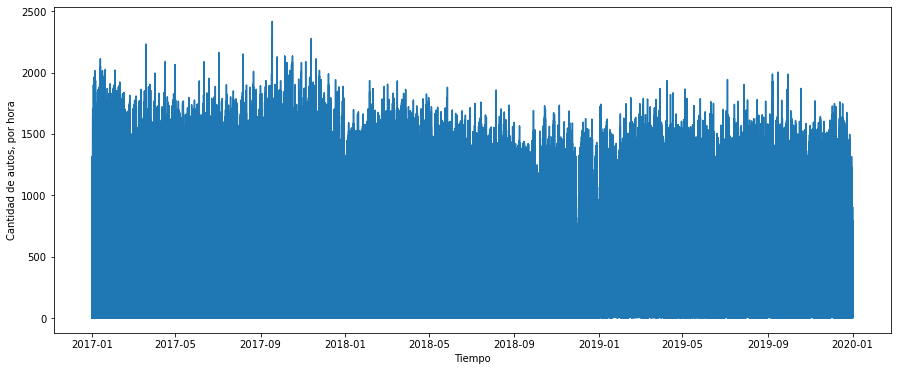

In [15]:
#Graficamos nuestros datos, tal como están
plt.figure(figsize = (15,6))
plt.plot(dataset2.fecha, dataset2.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

In [16]:
#Resampleamos nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario = dataset2.resample('D', on = 'fecha').sum()
print(diario.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


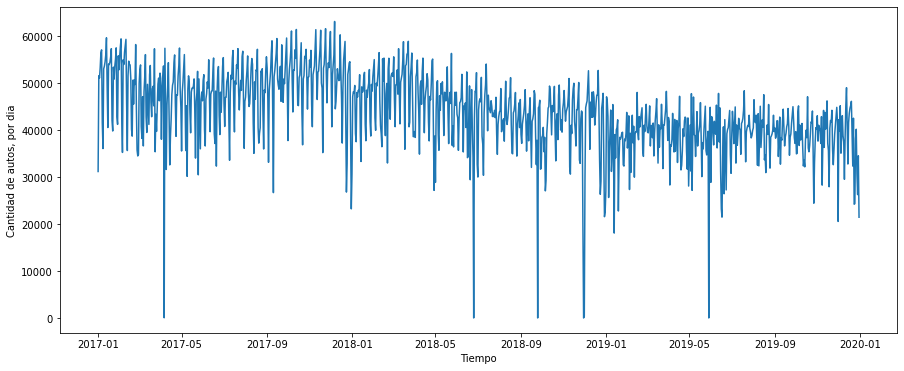

In [17]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

#### **IMPORTANTE: para ejecutar este *notebook*, además de las librerías que se han usado de rutina en clase, recurrí a las siguientes:**

- **pmdarima**: herramienta que implementa para Python la popular función auto_arima de lenguaje R, para análisis de series de tiempo.
- **Altair**: herramienta de visualización estadística.
- **Plotly**: herramienta para visualización de datos.
- **Prophet**: herramienta para trabajo con series de tiempo, diseñada por Facebook.

### **Parte A: Análisis Exploratorio de datos**

#### **Flujo de tránsito en función del día de la semana:**
Pregunta: ¿Hay fluctuación del tránsito de acuerdo al día de la semana?

En primera instancia, buscaré cómo es la circulación en el peaje de Illia en términos del día de la semana. Para ello, asigno el día de la semana a cada fecha del dataset diario.

In [18]:
diario.reset_index(inplace=True,drop=False)
diario

,fecha,cantidad_pasos
0,2017-01-01,31183
1,2017-01-02,51568
2,2017-01-03,51093
3,2017-01-04,53332
4,2017-01-05,56486
...,...,...
1090,2019-12-27,40182
1091,2019-12-28,30681
1092,2019-12-29,26259
1093,2019-12-30,34523


In [19]:
diario['dia']=diario['fecha'].dt.dayofweek

In [20]:
diario
#Monday=0, Sunday=6

,fecha,cantidad_pasos,dia
0,2017-01-01,31183,6
1,2017-01-02,51568,0
2,2017-01-03,51093,1
3,2017-01-04,53332,2
4,2017-01-05,56486,3
...,...,...,...
1090,2019-12-27,40182,4
1091,2019-12-28,30681,5
1092,2019-12-29,26259,6
1093,2019-12-30,34523,0


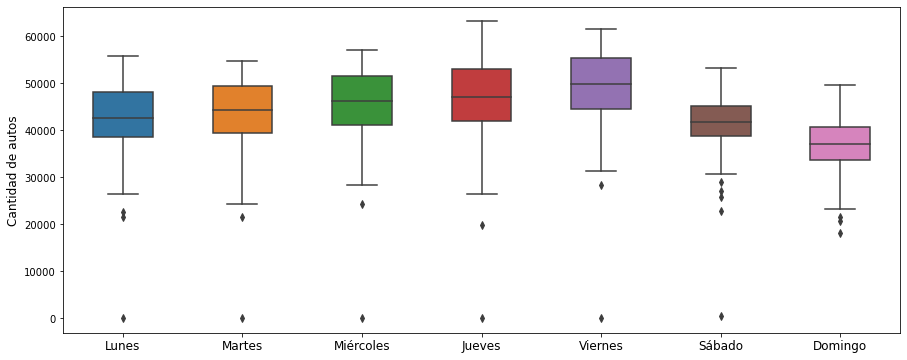

In [21]:
import seaborn as sns

plt.figure(figsize = (15,6))
sns.boxplot(diario.dia, diario.cantidad_pasos,width=0.5)
plt.xlabel('')
plt.ylabel('Cantidad de autos',size='large')
plt.xticks([0,1,2,3,4,5,6], ['Lunes','Martes','Miércoles','Jueves','Viernes','Sábado','Domingo'],size='large')
plt.show()

In [22]:
pasos_dia = diario.groupby("dia")["cantidad_pasos"].mean()
pasos_dia

dia
0    42620.299363
1    43729.624204
2    45676.448718
3    46808.775641
4    49020.974359
5    41293.044872
6    36891.471338
Name: cantidad_pasos, dtype: float64

En la figura se observa que el tráfico parece aumentar su caudal conforme avanza la semana laboral, alcanzando un pico los días viernes. El fin de semana el tráfico disminuye, en particular los días domingos. También puede verificarse la presencia de algunos valores atípicos. Esto se confirma al observar las medias para cada día en la celda de arriba (donde 0 es lunes y 6 es domingo). Por lo tanto, es razonable concluir que para la serie de tiempo 2017-2019 existiría cierta estacionalidad con el correr de los días de la semana.

Algunos de ellos, puede corresponder a días en los que se registró un caudal de vehículos particularmente bajo, pero hay ciertos puntos cercanos al cero. Se filtra el dataset para investigar de qué se trata.

In [23]:
mascara=(diario.cantidad_pasos<1000)
diario[mascara]

,fecha,cantidad_pasos,dia
95,2017-04-06,40,3
540,2018-06-25,0,0
632,2018-09-25,0,1
698,2018-11-30,0,4
699,2018-12-01,350,5
878,2019-05-29,0,2


In [24]:
fechas_outliers=diario.fecha[mascara]
fechas_outliers

95    2017-04-06
540   2018-06-25
632   2018-09-25
698   2018-11-30
699   2018-12-01
878   2019-05-29
Name: fecha, dtype: datetime64[ns]

Buscando los motivos en internet, se encontró que en esos días tuvieron lugar acontecimientos extraordinarios que afectaron la normal circulación del tránsito por la autopista:

- 06/04/2017: paro general.
- 25/06/2018: paro general.
- 25/09/2018: paro general.
- 30/11/2018 y 01/12/2018: cumbre del G-20 en Buenos Aires/feriado por decreto en la Ciudad de Buenos Aires.
- 29/05/2019: paro general.

Por lo tanto, se decide asignar a esos registros la media de cantidad de pasos registrada para el día en cuestión:

In [25]:
dias=np.arange(0,7)
diario['promedio_pasos_dia']=np.zeros(diario.shape[0])

for dia in dias:
    filtro=(diario.dia==dia)
    diario['promedio_pasos_dia']=np.where(filtro,pasos_dia[dia],diario['promedio_pasos_dia'])

In [26]:
diario.loc[mascara, 'cantidad_pasos'] = diario.promedio_pasos_dia
diario=diario.drop(columns='promedio_pasos_dia')

In [27]:
diario[mascara]

,fecha,cantidad_pasos,dia
95,2017-04-06,46808.775641,3
540,2018-06-25,42620.299363,0
632,2018-09-25,43729.624204,1
698,2018-11-30,49020.974359,4
699,2018-12-01,41293.044872,5
878,2019-05-29,45676.448718,2


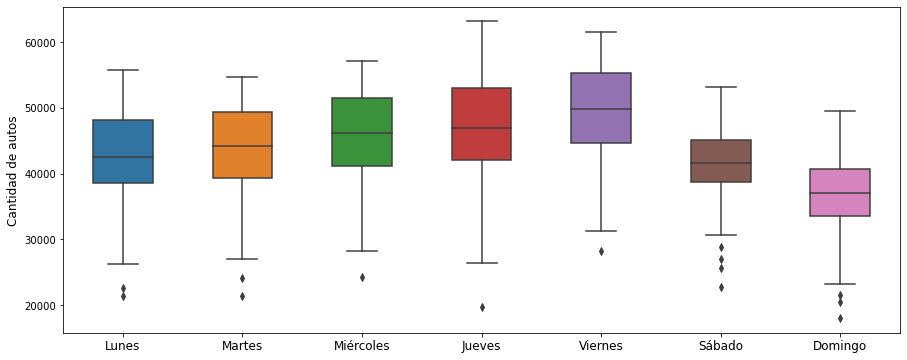

In [28]:
plt.figure(figsize = (15,6))
sns.boxplot(diario.dia, diario.cantidad_pasos,width=0.5)
plt.xlabel('')
plt.ylabel('Cantidad de autos',size='large')
plt.xticks([0,1,2,3,4,5,6], ['Lunes','Martes','Miércoles','Jueves','Viernes','Sábado','Domingo'],size='large')
plt.show()

En la figura precedente se constata que efectivamente los valores extremos debidos al cierre de la autopista por eventos extraordinarios han sido excluidos.

A continuación, se exploran si existen datos faltantes en el dataset, tanto a nivel de cantidad de pasos como a nivel de fechas. 

Los años 2017, 2018 y 2019 tuvieron 365 años cada uno, por lo que debería haber 1095 días registrados en el dataset. Utilizando la función diff() sobre la columna fecha, se obtienen 1094 diferencias de un día entre los registros, por lo que no existen fechas faltantes.

In [29]:
diario['date_check'] = diario.fecha.diff()
diario.date_check.value_counts()

1 days    1094
Name: date_check, dtype: int64

In [30]:
diario=diario.drop(columns='date_check')

Por otra parte, no existen datos faltantes para la cantidad de pasos (es decir, todos los días tienen datos en cuanto a la cantidad de pasos).

In [31]:
diario.cantidad_pasos.isna().sum()

0

#### **Flujo de tránsito en función de la hora del día:**
Pregunta: ¿hay fluctuación del tránsito a lo largo del día? ¿Varía este patrón según el día de la semana?

A continuación se hace un *re-sampling* de los datos para estudiar cómo fluctúa el tránsito en cuanto a las franjas horarias de cada día.

In [32]:
hora = dataset2.resample('H', on = 'fecha').sum()
print(hora.shape)
hora.head()

(26280, 1)


,cantidad_pasos
fecha,
2017-01-01 00:00:00,1576
2017-01-01 01:00:00,1
2017-01-01 02:00:00,1374
2017-01-01 03:00:00,1734
2017-01-01 04:00:00,1247


In [33]:
hora.reset_index(inplace=True,drop=False)
hora

,fecha,cantidad_pasos
0,2017-01-01 00:00:00,1576
1,2017-01-01 01:00:00,1
2,2017-01-01 02:00:00,1374
3,2017-01-01 03:00:00,1734
4,2017-01-01 04:00:00,1247
...,...,...
26275,2019-12-31 19:00:00,1217
26276,2019-12-31 20:00:00,1374
26277,2019-12-31 21:00:00,1706
26278,2019-12-31 22:00:00,1139


In [34]:
hora['hora']=hora['fecha'].dt.hour 
hora

,fecha,cantidad_pasos,hora
0,2017-01-01 00:00:00,1576,0
1,2017-01-01 01:00:00,1,1
2,2017-01-01 02:00:00,1374,2
3,2017-01-01 03:00:00,1734,3
4,2017-01-01 04:00:00,1247,4
...,...,...,...
26275,2019-12-31 19:00:00,1217,19
26276,2019-12-31 20:00:00,1374,20
26277,2019-12-31 21:00:00,1706,21
26278,2019-12-31 22:00:00,1139,22


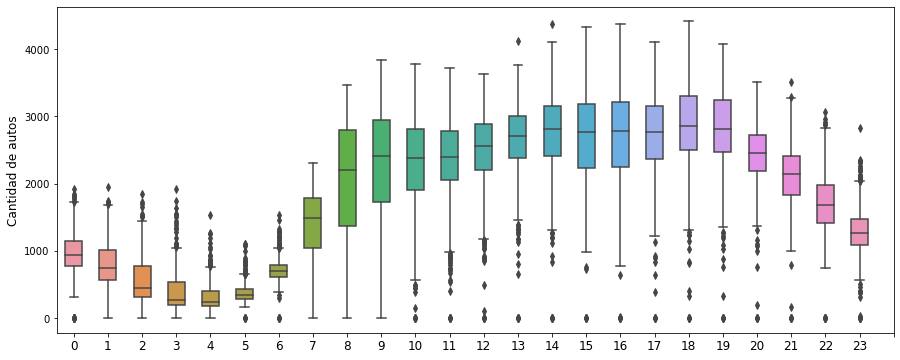

In [35]:
plt.figure(figsize = (15,6))
sns.boxplot(hora.hora, hora.cantidad_pasos,width=0.5)
plt.xlabel('')
plt.ylabel('Cantidad de autos',size='large')
plt.xticks(np.arange(0,25),size='large')
plt.show()

Este análisis permite inferir que, tal como se esperaba, la circulación diurna es muy superior a la nocturna. Los valores mínimos de circulación se registran entre las 2 y las 5 de la mañana. A partir de las 6, el flujo de vehículos comienza a subir de manera sostenida hasta las 13 horas. A partir del mediodía, los niveles de circulación se mantienen altos hasta las 19h, donde comienzan a caer en forma continua al avanzar la noche. Teniendo en cuenta esta granularidad de horas, es razonable concluir que también existiría una estacionalidad del flujo de tránsito en la autopista Illia a lo largo del día.

A continuación, analizo si esta fluctuación a lo largo del día se ve afectada según el día de la semana.

In [36]:
hora['dia']=hora['fecha'].dt.weekday 
hora

,fecha,cantidad_pasos,hora,dia
0,2017-01-01 00:00:00,1576,0,6
1,2017-01-01 01:00:00,1,1,6
2,2017-01-01 02:00:00,1374,2,6
3,2017-01-01 03:00:00,1734,3,6
4,2017-01-01 04:00:00,1247,4,6
...,...,...,...,...
26275,2019-12-31 19:00:00,1217,19,1
26276,2019-12-31 20:00:00,1374,20,1
26277,2019-12-31 21:00:00,1706,21,1
26278,2019-12-31 22:00:00,1139,22,1


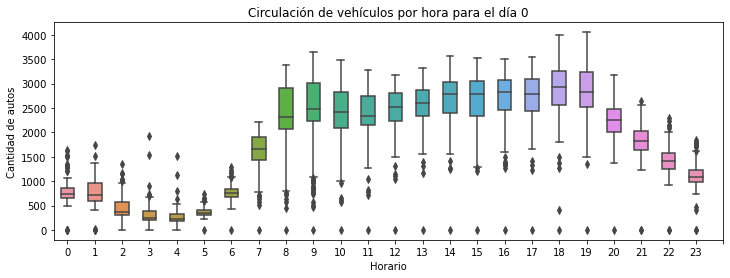

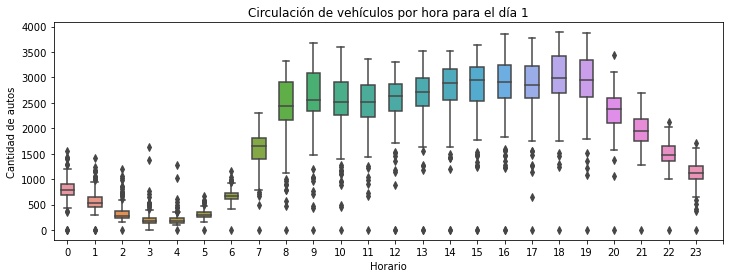

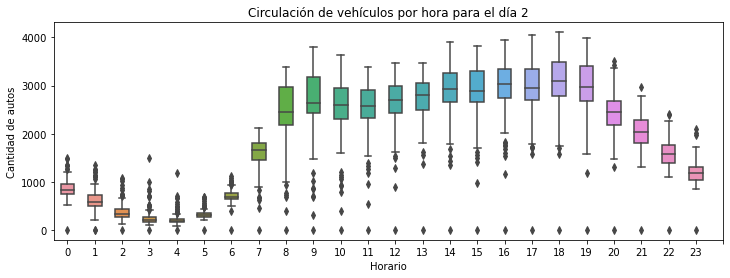

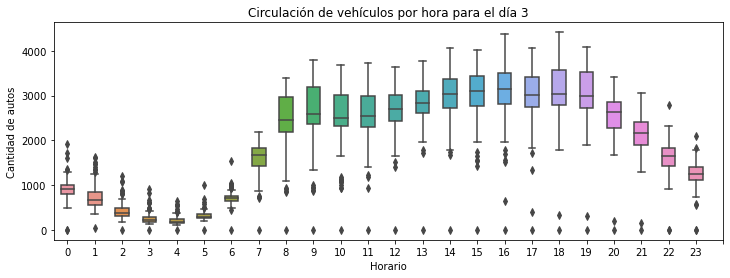

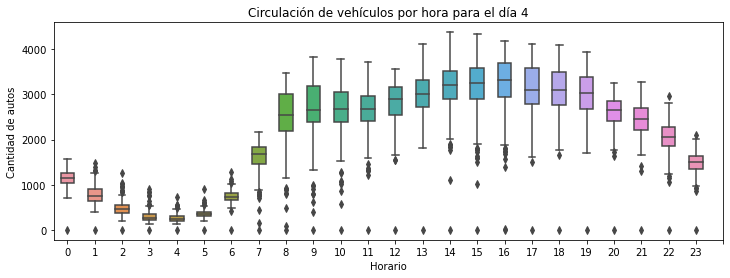

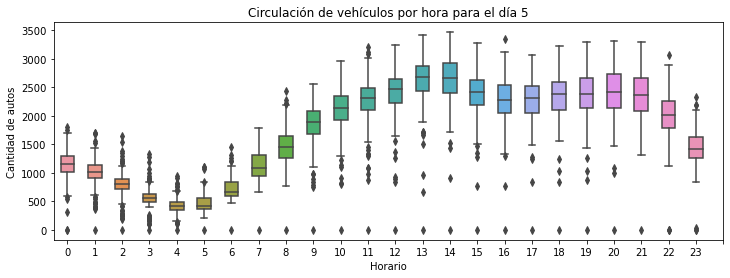

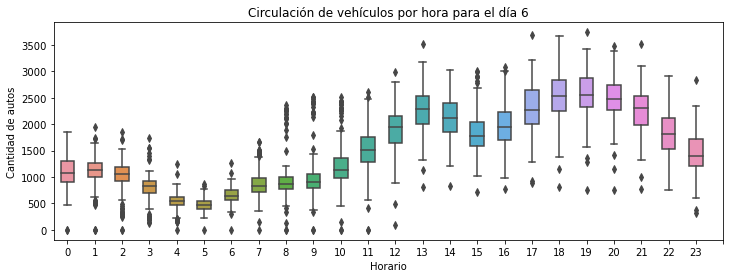

In [37]:
for dia in dias:
    plt.figure(figsize = (12,4))
    sns.boxplot(hora.hora, hora.cantidad_pasos[hora.dia==dia],width=0.5)
    plt.xlabel('Horario')
    plt.ylabel('Cantidad de autos',size='medium')
    plt.xticks(np.arange(0,25),size='medium')
    plt.title('Circulación de vehículos por hora para el día {}'.format(dia))
    plt.show()

En las figuras precedentes, se observa que los días de semana tienden a comportarse de forma similar, pero los días sábado y domingo (días 5 y 6) muestran ciertas diferencias. El domingo la circulación se reduce en términos de cantidad de vehículos, mientras que el tránsito parece incrementarse más entrada la mañana y parece ser algo más elevado en horarios nocturnos (esto último también parece ser cierto para los días viernes).

A continuación, se imputan los valores de los días para los que hubo acontecimientos extraordinarios (paros y cumbre del G-20) con el promedio de flujo vehicular para ese día y hora en cuestión.

In [38]:
pasos_hora = hora.groupby(by=['dia','hora'],as_index=False)["cantidad_pasos"].mean()
pasos_hora=pd.DataFrame(pasos_hora)
pasos_hora

,dia,hora,cantidad_pasos
0,0,0,768.484076
1,0,1,776.840764
2,0,2,468.802548
3,0,3,328.127389
4,0,4,273.229299
...,...,...,...
163,6,19,2561.095541
164,6,20,2476.382166
165,6,21,2264.617834
166,6,22,1837.464968


In [39]:
fechas_outliers_string=[]

for fecha in fechas_outliers:
    fecha=fecha.strftime('%Y-%m-%d')
    fechas_outliers_string.append(fecha)

fechas_outliers_string

['2017-04-06',
 '2018-06-25',
 '2018-09-25',
 '2018-11-30',
 '2018-12-01',
 '2019-05-29']

In [40]:
hora['fecha2']=hora.fecha.dt.strftime('%Y-%m-%d')
mascara=hora.fecha2.isin(fechas_outliers_string)
auxiliar=hora[mascara]
auxiliar

,fecha,cantidad_pasos,hora,dia,fecha2
2280,2017-04-06 00:00:00,0,0,3,2017-04-06
2281,2017-04-06 01:00:00,40,1,3,2017-04-06
2282,2017-04-06 02:00:00,0,2,3,2017-04-06
2283,2017-04-06 03:00:00,0,3,3,2017-04-06
2284,2017-04-06 04:00:00,0,4,3,2017-04-06
...,...,...,...,...,...
21091,2019-05-29 19:00:00,0,19,2,2019-05-29
21092,2019-05-29 20:00:00,0,20,2,2019-05-29
21093,2019-05-29 21:00:00,0,21,2,2019-05-29
21094,2019-05-29 22:00:00,0,22,2,2019-05-29


In [41]:
auxiliar2=auxiliar.reset_index().merge(pasos_hora,how='left',on=['hora','dia'],suffixes=("_real", "_promedio")).set_index('index')
auxiliar2=auxiliar2.drop(columns=['fecha2','cantidad_pasos_real'])
auxiliar2=auxiliar2.rename(columns={'cantidad_pasos_promedio': 'cantidad_pasos'})
auxiliar2

,fecha,hora,dia,cantidad_pasos
index,,,,
2280,2017-04-06 00:00:00,0,3,919.730769
2281,2017-04-06 01:00:00,1,3,736.435897
2282,2017-04-06 02:00:00,2,3,427.147436
2283,2017-04-06 03:00:00,3,3,253.019231
2284,2017-04-06 04:00:00,4,3,211.621795
...,...,...,...,...
21091,2019-05-29 19:00:00,19,2,2972.070513
21092,2019-05-29 20:00:00,20,2,2432.993590
21093,2019-05-29 21:00:00,21,2,2034.314103


In [42]:
hora.update(auxiliar2)

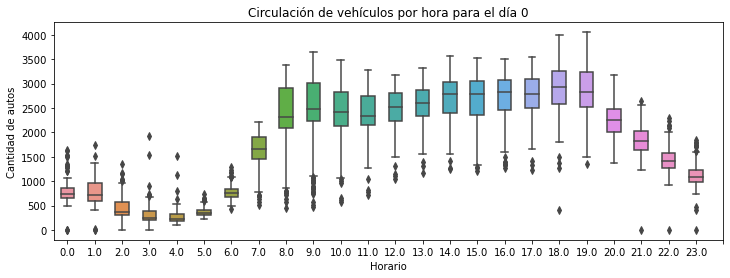

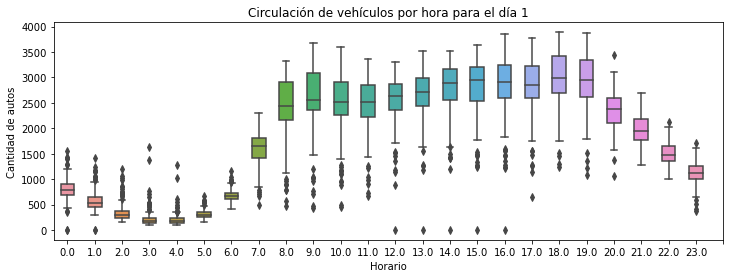

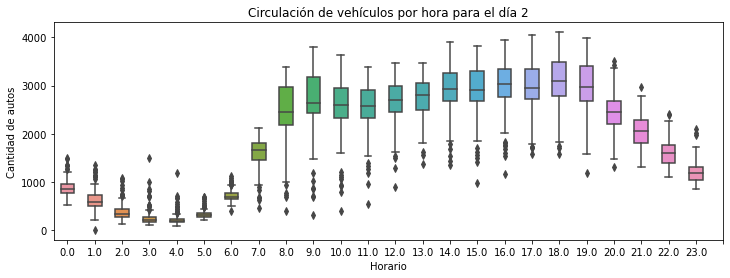

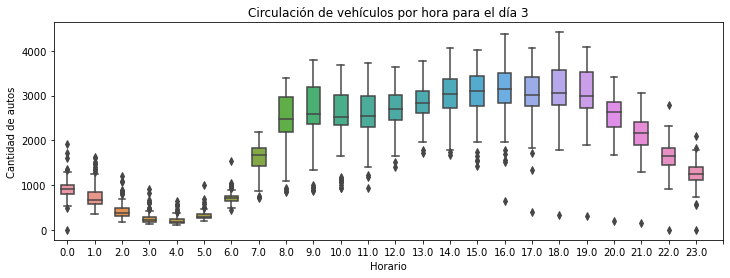

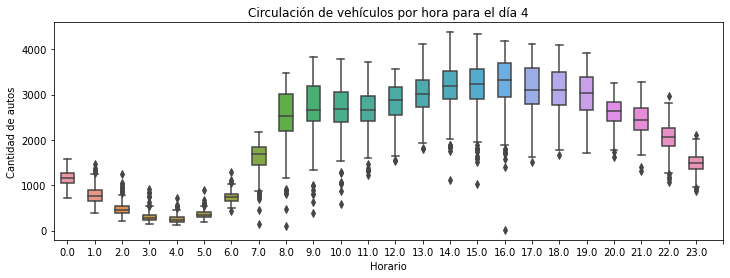

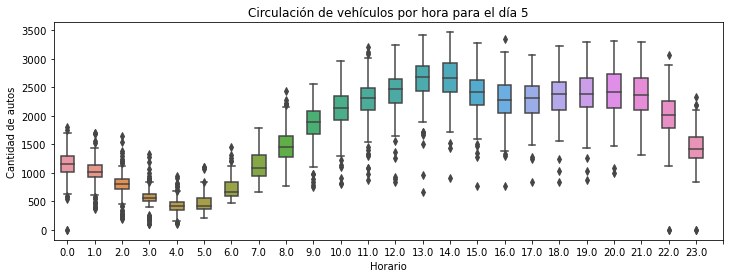

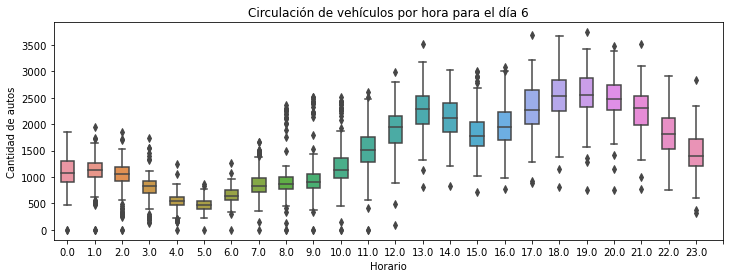

In [43]:
for dia in dias:
    plt.figure(figsize = (12,4))
    sns.boxplot(hora.hora, hora.cantidad_pasos[hora.dia==dia],width=0.5)
    plt.xlabel('Horario')
    plt.ylabel('Cantidad de autos',size='medium')
    plt.xticks(np.arange(0,25),size='medium')
    plt.title('Circulación de vehículos por hora para el día {}'.format(dia))
    plt.show()

#### **Estudio de autocorrelaciones**

Se efectúa un análisis de autocorrelación de la serie temporal, a fin de estudiar si la cantidad de pasos por el puesto de peaje tiene cierta dependencia con valores anteriores de la serie de tiempo. En primer lugar, se hace un estudio desfasando la serie una unidad temporal (en este caso, un día), por un total de 365 días.

In [44]:
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

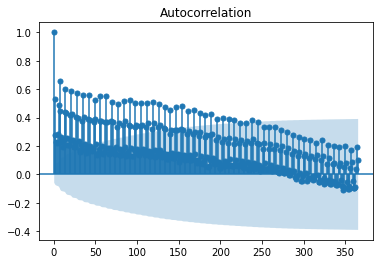

In [45]:
plot_acf(diario.cantidad_pasos, lags = 365)
plt.show()

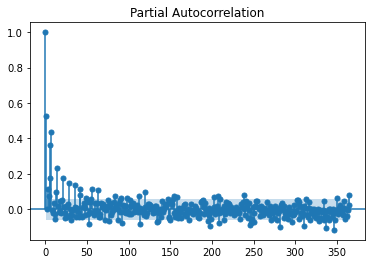

In [46]:
from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(diario.cantidad_pasos, lags=365)
plt.show()

En el correlograma, se observa que hay cierta dependencia de de los valores de flujo vehicular con el tránsito registrado anteriormente. Se registra una mayor autocorrelación a períodos de tiempo relativamente cortos. El efecto tiende a diluirse progresivamente al aumentar el número de días que se toma como *lag*, lo cual es típico de series de tiempo de series con cierta tendencia.

De todas formas, no se llega a analizar dicha autocorrelación en detalle, por lo que se grafica para *lags* más cortos, de hasta un mes.

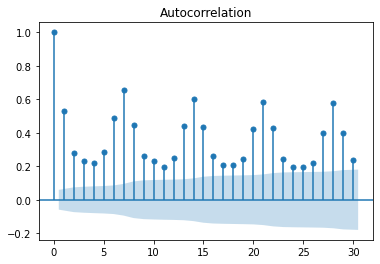

In [47]:
plot_acf(diario.cantidad_pasos, lags = 365/12)
plt.show()

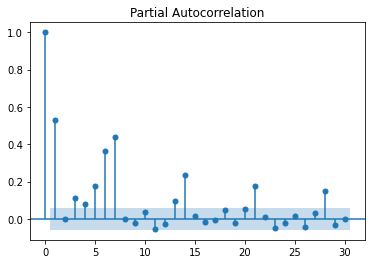

In [48]:
plot_pacf(diario.cantidad_pasos, lags=365/12)
plt.show()

En este caso, puede verse que, adicionalmente a la caída suave de los valores de autocorrelación al aumentar el período de *lag*, hay una oscilación de los valores de correlación que reflejan una dependencia del número de vehículos con el registrado para ese mismo día de la semana anterior (*lag*=7), y para ese mismo día de las semanas anteriores. Esta autocorrelación con *lags* de una semana tienen sentido, considerando las fluctuaciones semanales en el tránsito que se describieron anteriormente.

Por su parte, el estudio de la autocorrelación parcial permite inferir que la principal componente de la autocorrelación se da con un *lag* de  7 días. Para *lags* mayores, la autocorrelación parcial disminuye notablemente al comparar con el gráfico de autocorrelación precedente, lo cual se explica teniendo en cuenta que la autocorrelación parcial resulta de sustraer los efectos de correlación a *lags* menores (correlaciones indirectas).

Otra forma de estudiar este patrón de autocorrelación es graficando *lag plots*, en donde se grafican la cantidad de pasos vehiculares registrados para un tiempo t y un tiempo t+*lag*. En esta figura a continuación, se ve una mayor tendencia a la correlación para un lag de 7 días, mientra que dicha correlación se pierde para *lags* de 3, 4 y 5 días. En el resto de los casos se observa una situación intermedia.

<function matplotlib.pyplot.show(close=None, block=None)>

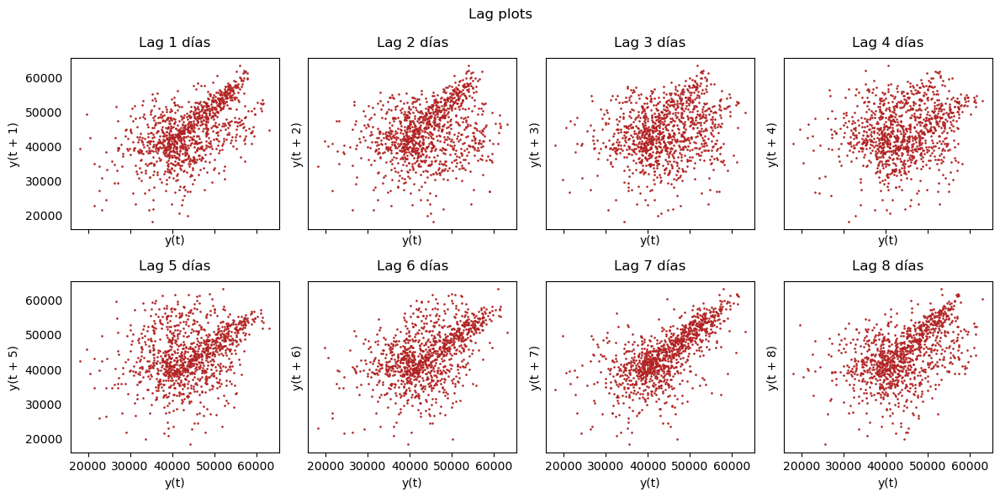

In [49]:
from pandas.plotting import lag_plot
plt.rcParams.update({'ytick.left' : False, 'axes.titlepad':10})

# Plot
fig, axes = plt.subplots(2, 4, figsize=(12,6), sharex=True, sharey=True, dpi=100)
for i, ax in enumerate(axes.flatten()[:8]):
    lag_plot(diario.cantidad_pasos, lag=i+1, ax=ax, c='firebrick',s=0.8)
    ax.set_title('Lag ' + str(i+1) + ' días')

fig.suptitle('Lag plots')
plt.tight_layout()
plt.show

#### **Estudios de la tendencia de la serie**

Para confirmar si la serie temporal es o no estacionaria, se hace la prueba estadística de Dickey-Fuller aumentada (ADF). Un resultado significativo (p<0,05) indica que la serie es estacionaria. Dado que el valor de p obtenido es de 0,44, se concluye que la serie no es estacionaria. Este fenómeno ya se intuía en la figura de la serie temporal. A continuación, se usan distintas herramientas para efectivamente confirmar esta tendencia.

In [50]:
from statsmodels.tsa.stattools import adfuller

print('Prueba estadística ADFuller')
ad_fuller_result = adfuller(diario.cantidad_pasos)
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

Prueba estadística ADFuller
ADF Statistic: -1.6771200011601186
p-value: 0.4429378142707017


##### **Regresión lineal**

En primer lugar, se recurre a una regresión lineal como primera aproximación para visualizar la tendencia global de la serie en el tiempo, más allá de sus patrones estacionales.

In [51]:
diario['fecha_numeros']=diario.fecha.map(datetime.datetime.toordinal)
diario.head()

,fecha,cantidad_pasos,dia,fecha_numeros
0,2017-01-01,31183.0,6,736330
1,2017-01-02,51568.0,0,736331
2,2017-01-03,51093.0,1,736332
3,2017-01-04,53332.0,2,736333
4,2017-01-05,56486.0,3,736334


In [52]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(diario.fecha_numeros.values.reshape(-1, 1), diario.cantidad_pasos)

LinearRegression()

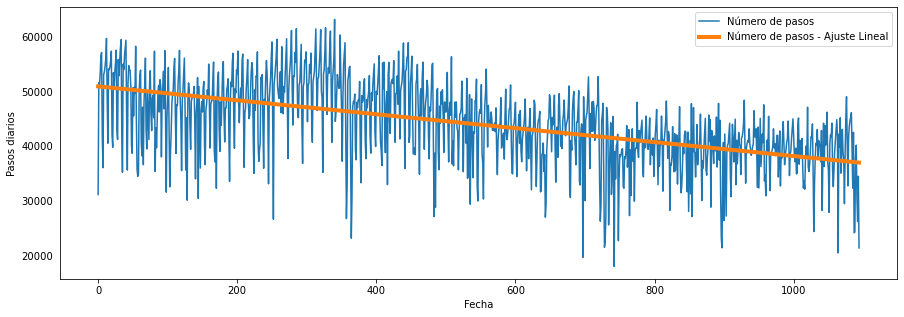

In [53]:
plt.figure(figsize = (15,5))
plt.plot(diario.index, diario.cantidad_pasos, label = 'Número de pasos')
plt.plot(diario.index, lr.predict(diario.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Número de pasos - Ajuste Lineal')
plt.xlabel('Fecha')
plt.ylabel('Pasos diarios')
plt.legend()
plt.show()

La figura precedente muestra una clara tendencia a la baja en el número de pasos diarios por el peaje de la autopista Illia con modalidad de pago en efectivo. Por supuesto, la regresión lineal no es un modelo que permita predecir el comportamiento de la serie en el futuro debido a su alto sesgo.

**Una nueva pregunta para el Análisis Exploratorio de datos:**
¿La merma en la cantidad de pasos con forma de pago en efectivo, se puede explicar a raíz del crecimiento de otras formas de pago?


Con el fin de determinar qué puede justificar la caída en el número de vehículos que circulan por el peaje de la autopista Illia y abonan en efectivo, se miran mejor los datos para este peaje.

In [54]:
dataset.drop(columns=['hora_inicio'], inplace=True)
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')
dataset.drop(columns=['fecha','hora_fin'], inplace = True)
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True)
dataset.sort_values('fecha', inplace = True)
dataset['mes']=dataset['fecha'].dt.month
dataset.reset_index(drop=True, inplace = True)
mascara = dataset.estacion=='Illia'
dataset=dataset[mascara]
dataset

,periodo,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos,fecha,mes
1,2017,Domingo,Illia,Provincia,Liviano,EFECTIVO,9,2017-01-01 00:00:00,1
2,2017,Domingo,Illia,Provincia,Liviano,NO COBRADO,3,2017-01-01 00:00:00,1
21,2017,Domingo,Illia,Centro,Pesado,TELEPASE,1,2017-01-01 00:00:00,1
22,2017,Domingo,Illia,Provincia,Liviano,EXENTO,2,2017-01-01 00:00:00,1
23,2017,Domingo,Illia,Provincia,Liviano,EFECTIVO,644,2017-01-01 00:00:00,1
...,...,...,...,...,...,...,...,...,...
3560696,2019,Martes,Illia,Centro,Liviano,TELEPASE,122,2019-12-31 23:00:00,12
3560697,2019,Martes,Illia,Centro,Liviano,NO COBRADO,3,2019-12-31 23:00:00,12
3560698,2019,Martes,Illia,Centro,Liviano,INFRACCION,4,2019-12-31 23:00:00,12
3560699,2019,Martes,Illia,Centro,Liviano,EXENTO,1,2019-12-31 23:00:00,12


Se agrupan los datos por forma de pago y período (año) para luego poder graficar cómo es la composición por forma de pago en cada año.

In [55]:
forma_pago = dataset.groupby(by=['forma_pago','periodo','mes'],as_index=False)["cantidad_pasos"].sum()
forma_pago=pd.DataFrame(forma_pago)
forma_pago

,forma_pago,periodo,mes,cantidad_pasos
0,EFECTIVO,2017,1,1565260
1,EFECTIVO,2017,2,1363113
2,EFECTIVO,2017,3,1451214
3,EFECTIVO,2017,4,1373985
4,EFECTIVO,2017,5,1407136
...,...,...,...,...
212,TELEPASE,2019,8,1663947
213,TELEPASE,2019,9,1579428
214,TELEPASE,2019,10,1677275
215,TELEPASE,2019,11,1677177


En la figura a continuación se observa que al avanzar en el tiempo, hay una reducción en la cantidad de pasos en efectivo, que se ve acompañada de una suba en la cantidad de vehículos que pasan por el peaje con telepase. Además, el número total de vehículo se mantiene relativamente constante (tiende a aumentar en relación a 2017, pero no significativamente). Esto induce a pensar que la tendencia a la disminución en la circulación de vehículos que abonan en efectivo por la autopista Illia puede deberse a una migración a otra modalidad de pago (telepase).

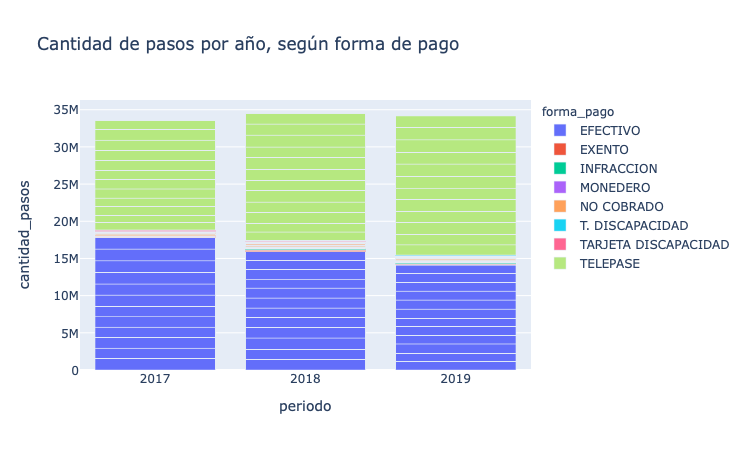

In [56]:
import plotly.express as px

fig = px.bar(forma_pago, x="periodo", y="cantidad_pasos",
             color="forma_pago", 
             title="Cantidad de pasos por año, según forma de pago")

fig.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 1))
fig.show()

A continuación agrupo los datos por mes del año para armar un gráfico de líneas de la evolución de cantidad de pasos en función de la forma de pago, mes a mes (en lugar de año a año). La figura a continuación muestra una clara disminución de los vehículos con medio de pago en efectivo, acompañada por un aumento casi compensantorio de la cantidad de vehículo con telepase, corroborando la hipótesis que el telepase fue reemplazando progresivamente al efectivo.

In [57]:
dataset['fecha2']=dataset.fecha.dt.strftime('%Y-%m')
forma_pago_diaria = dataset.groupby(by=['forma_pago','fecha2'],as_index=False)["cantidad_pasos"].sum()
forma_pago_diaria =pd.DataFrame(forma_pago_diaria)
forma_pago_diaria

,forma_pago,fecha2,cantidad_pasos
0,EFECTIVO,2017-01,1565260
1,EFECTIVO,2017-02,1363113
2,EFECTIVO,2017-03,1451214
3,EFECTIVO,2017-04,1373985
4,EFECTIVO,2017-05,1407136
...,...,...,...
212,TELEPASE,2019-08,1663947
213,TELEPASE,2019-09,1579428
214,TELEPASE,2019-10,1677275
215,TELEPASE,2019-11,1677177


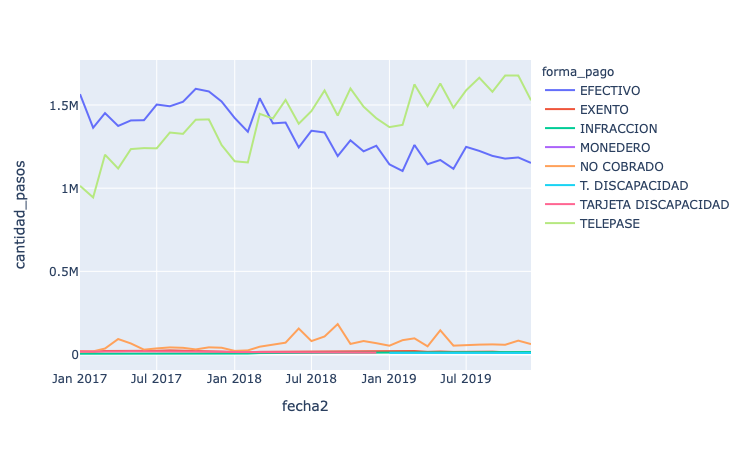

In [58]:
fig = px.line(forma_pago_diaria, x="fecha2", y="cantidad_pasos", color='forma_pago')
fig.show()

##### **Media móvil (*rolling average*)**

A continuación, se calcula la media móvil de la serie. Se probó con varias ventanas de tiempo (un año, un semestre, un cuatrimestre, un bimestre, un mes, una quincena y una semana). Para ventanas de tiempo relativamente largas (por ejemplo, un año), se observó la tendencia a la baja en el número de pasos, pero como el período total analizado comprende 3 años, sólo puede calcularse para un período de tiempo más acotado. Para períodos de tiempo más cortos (una semana, una quincena), la media móvil todavía muestra una variabilidad muy alta y sigue un patrón similar a los datos crudos. Se terminó optando por una ventana de tiempo intermedia (un bimestre) que resultara un compromiso.

In [59]:
ventana = int(365/6)
promedio_tendencia = diario.cantidad_pasos.rolling(window=ventana, center = True).mean()
promedio_tendencia

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
1090   NaN
1091   NaN
1092   NaN
1093   NaN
1094   NaN
Name: cantidad_pasos, Length: 1095, dtype: float64

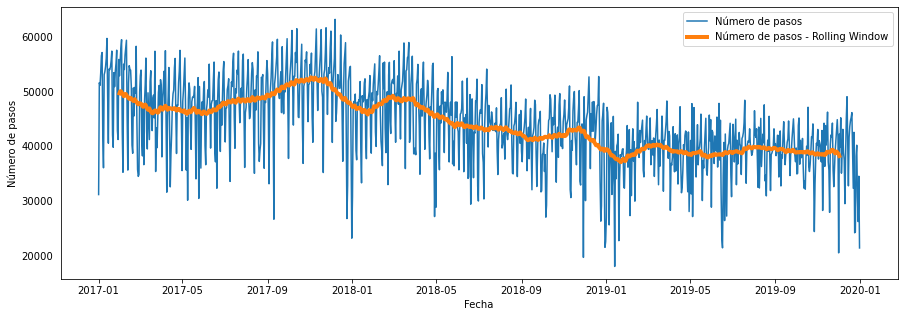

In [60]:
plt.figure(figsize = (15,5))
plt.plot(diario.fecha, diario.cantidad_pasos, label = 'Número de pasos')
plt.plot(diario.fecha, promedio_tendencia, lw = 4, label = 'Número de pasos - Rolling Window')
plt.xlabel('Fecha')
plt.ylabel('Número de pasos')
plt.legend()
plt.show()

Se calcula la diferencia entre la serie original y la media móvil a fin de obtener la componente de tendencia, que una vez más, se muestra a la baja. De todas formas, esta aproximación permite obtener una tendencia que refleja mejor el comportamiento de la serie en comparación con la regresión lineal.

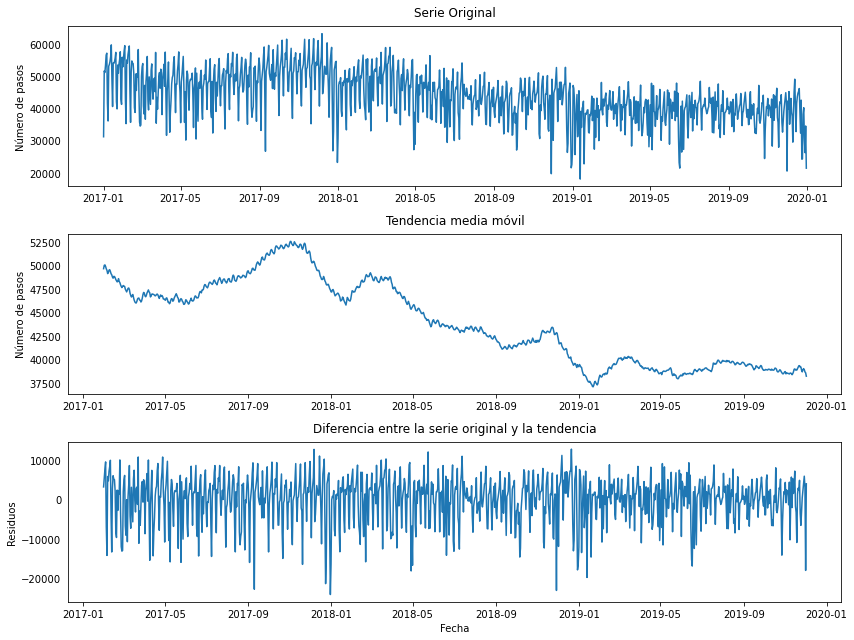

In [61]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(diario.fecha, diario.cantidad_pasos)
plt.ylabel('Número de pasos')

plt.subplot(3,1,2)
plt.title('Tendencia media móvil')
plt.plot(diario.fecha,promedio_tendencia)
plt.ylabel('Número de pasos')


plt.subplot(3,1,3)
plt.title('Diferencia entre la serie original y la tendencia')
plt.plot(diario.fecha, diario.cantidad_pasos - promedio_tendencia)
plt.xlabel('Fecha')
plt.ylabel('Residuos')

plt.tight_layout()
plt.show()

Se hace nuevamente la prueba estadística de Dickey Fuller para testear si la serie resultante es estacionaria. Efectivamente, la prueba da un p<0,05, por lo que la serie sería estacionaria tras esta transformación.

In [62]:
diferencia=diario.cantidad_pasos - promedio_tendencia
diferencia2=diferencia.dropna()
print('Prueba estadística ADFuller')
ad_fuller_result = adfuller(diferencia2)
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

Prueba estadística ADFuller
ADF Statistic: -7.993636050241115
p-value: 2.4368449972292406e-12


##### **Media móvil ponderada exponencialmente**

Otra forma de hacer este análisis es calculando la media móvil exponencial, que calcula la media ponderando los valores de la serie en función de cuándo ocurrieron. De esta forma, el valor se construye dando peso a los registros cercanos en el tiempo en lugar, y da menos peso a los registros más alejados en el tiempo.

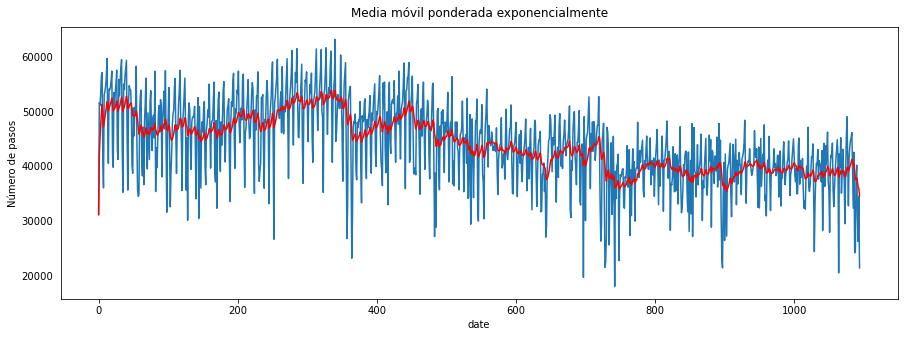

In [63]:
fig,axes = plt.subplots(1,1,figsize=(15,5))
axes.set_title("Media móvil ponderada exponencialmente")
axes.set_ylabel("Número de pasos")
axes.set_xlabel("date")
expwighted_avg = diario.cantidad_pasos.ewm(halflife=7).mean()
plt.plot(diario.cantidad_pasos)
plt.plot(expwighted_avg, color='red')

En forma análoga al caso anterior, se sustrae la media móvil ponderada a la serie, y se evalúa si la resultante es estacionaria con la prueba de Dickey Fuller.  En este caso, también la prueba estadística de Dickey Fuller resultó significativa, por lo que la diferencia resulta una serie de tiempo estacionaria. Sin embargo, el resultado en este caso es comparable con el obtenido anteriormente, por lo que que la media móvil convencional es suficiente para sustraer la tendencia en este caso.

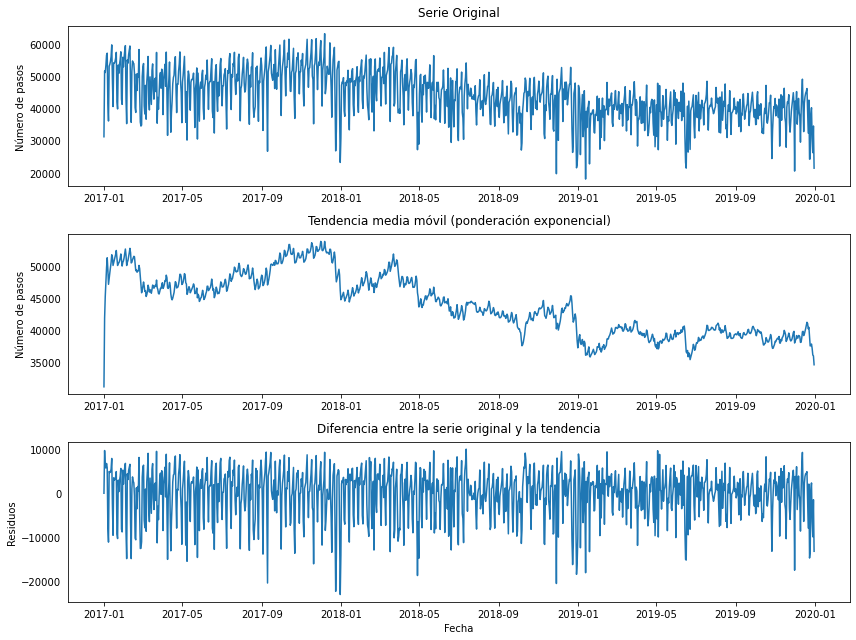

In [64]:
plt.figure(figsize = (12,9))

plt.subplot(3,1,1)
plt.title('Serie Original')
plt.plot(diario.fecha, diario.cantidad_pasos)
plt.ylabel('Número de pasos')

plt.subplot(3,1,2)
plt.title('Tendencia media móvil (ponderación exponencial)')
plt.plot(diario.fecha,expwighted_avg)
plt.ylabel('Número de pasos')

plt.subplot(3,1,3)
plt.title('Diferencia entre la serie original y la tendencia')
plt.plot(diario.fecha, diario.cantidad_pasos - expwighted_avg)
plt.xlabel('Fecha')
plt.ylabel('Residuos')

plt.tight_layout()
plt.show()

In [65]:
diferencia3=diario.cantidad_pasos - expwighted_avg
diferencia4=diferencia3.dropna()
print('Prueba estadística ADFuller')
ad_fuller_result = adfuller(diferencia4)
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

Prueba estadística ADFuller
ADF Statistic: -6.799542381248642
p-value: 2.255427533365107e-09


A continuación, se analiza si sigue habiendo un efecto estacional en la serie a la que se le sustrajo la media móvil previamente, graficando su autocorrelograma. Se observa que a pesar de haber removido la tendencia, sigue habiendo un patrón semanal, registrado por un pico de autocorrelación cada 7 días. Por lo tanto, a continuación se trata a la serie temporal con diferenciación y descomposición.

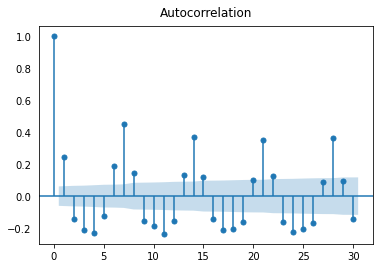

In [66]:
diferencia=diario.cantidad_pasos - promedio_tendencia
diferencia2=diferencia.dropna()
plot_acf(diferencia2, lags = 365/12)
plt.show()

##### **Diferenciación de la serie temporal**

Uno de los métodos más comunes para lidiar simultáneamente con la estacionalidad y la tendencia consiste en "diferenciar" la serie de tiempo, tomando la diferencia de la medición a un determinado tiempo t, con la correspondiente para el tiempo t-1. A continuación, se calculan distintos órdenes de diferenciación para la serie de tiempo en cuestión, y se calcula en paralelo su autocorrelación. Para los órdenes 1 y 2 de diferenciación, se observa que si bien se logra manejar más o menos adecuadamente la tendencia de la serie, aún continúa registrándose, aunque en menor medida, un patrón de autocorrelación, probablemente debido a la estacionalidad.

En base a estas figuras, es probable que un término de diferenciación deberá ser incluido al momento de generar el modelo ARIMA (término d).

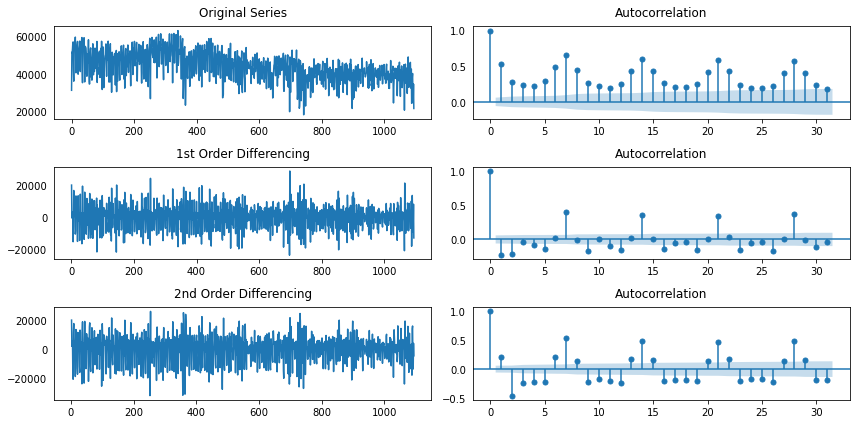

In [67]:
fig, ax = plt.subplots(3, 2, figsize=(12,6))

# Original Series
ax[0, 0].plot(diario.cantidad_pasos); ax[0, 0].set_title('Original Series')
plot_acf(diario.cantidad_pasos, ax=ax[0, 1])

# 1st Differencing
ax[1, 0].plot(diario.cantidad_pasos.diff(periods=1)); ax[1, 0].set_title('1st Order Differencing')
plot_acf(diario.cantidad_pasos.diff(periods=1).dropna(), ax=ax[1, 1])

# 2nd Differencing
ax[2, 0].plot(diario.cantidad_pasos.diff(periods=2)); ax[2, 0].set_title('2nd Order Differencing')
plot_acf(diario.cantidad_pasos.diff(periods=2).dropna(), ax=ax[2, 1])

plt.tight_layout()
plt.show()

Se corre el siguiente código para evaluar cuántas diferenciaciones serían necesarias para hacer a la serie estacionaria, concluyéndose que con una diferenciación d=1 sería suficiente.

In [68]:
from pmdarima.arima.utils import ndiffs

n_adf = ndiffs(diario.cantidad_pasos)
print('Número de diferenciaciones necesarias para hacer la serie estacionaria:',n_adf)

Número de diferenciaciones necesarias para hacer la serie estacionaria: 1


##### **Descomposición de la serie temporal**

Se recurrió también al método *seasonal_decompose* de Statsmodel para obtener los componentes de la serie, modelando por separado la tendencia y la estacionalidad. Se probó con distintos parámetros para *period*: 7 (fluctuaciones semanales), 30 (fluctuaciones mensuales) y 365 (fluctuaciones anuales). En todos los casos, la prueba estadística Dickey-Fuller sobre los residuos producto de la descomposición, resultó significativa, por lo que se concluye que los residuos resultantes son estacionarios en la media. De todas formas, al usar un período de 7 días, se obtienen los mejores resultados, en cuanto que el estadístico toma un valor negativo de mayor magnitud y su valor de p es menor.

Text(0.5, 1.0, 'Descomposión de la serie para un período de 7 días')

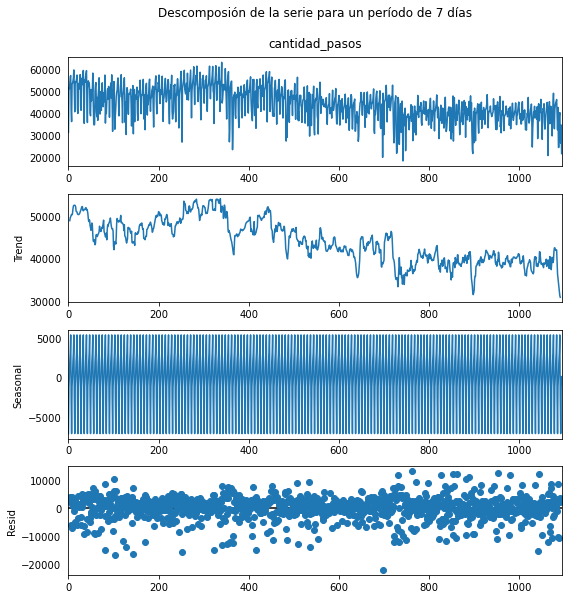

In [69]:
from statsmodels.tsa.seasonal import seasonal_decompose

resultado = seasonal_decompose(diario.cantidad_pasos, period=7, model='additive')
plt.rcParams['figure.figsize'] = [8,8]
resultado.plot()
plt.title('Descomposión de la serie para un período de 7 días',pad=450)

In [70]:
residuos=resultado.seasonal

from statsmodels.tsa.stattools import adfuller

print('Prueba estadística ADFuller para período de 7 días')
ad_fuller_result = adfuller(residuos)
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

Prueba estadística ADFuller para período de 7 días
ADF Statistic: -1.7897664276559266e+16
p-value: 0.0


Text(0.5, 1.0, 'Descomposión de la serie para un período de 30 días')

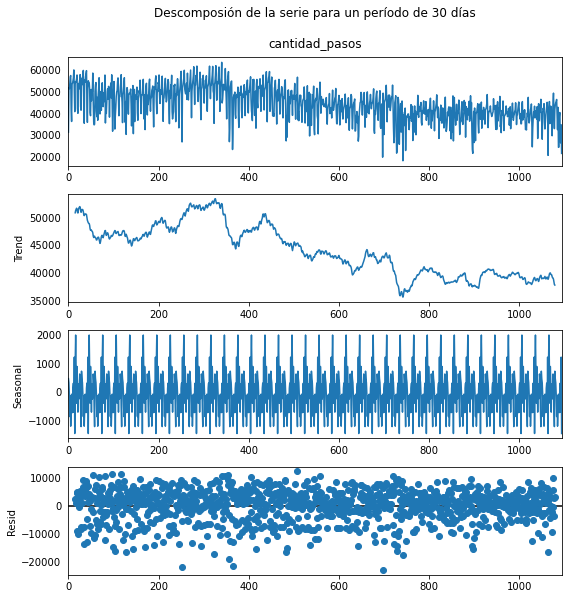

In [71]:
resultado = seasonal_decompose(diario.cantidad_pasos, period=30, model='additive')
plt.rcParams['figure.figsize'] = [8,8]
resultado.plot()
plt.title('Descomposión de la serie para un período de 30 días',pad=450)

In [72]:
residuos=resultado.seasonal

print('Prueba estadística ADFuller para período de 30 días')
ad_fuller_result = adfuller(residuos)
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

Prueba estadística ADFuller para período de 30 días
ADF Statistic: -24.366747893707963
p-value: 0.0


Text(0.5, 1.0, 'Descomposión de la serie para un período de 365 días')

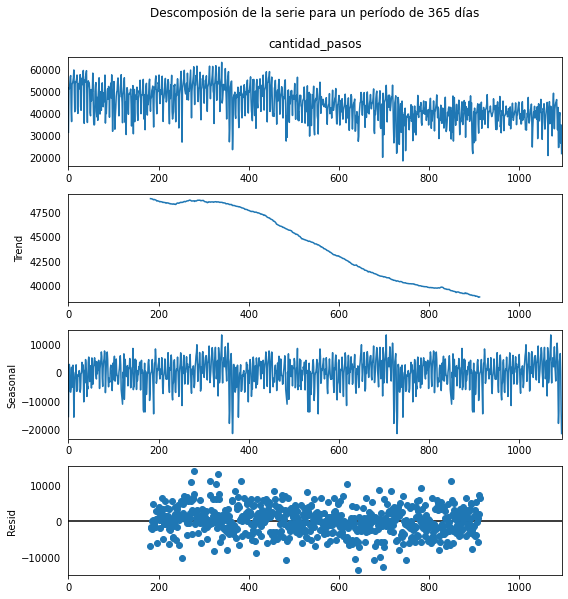

In [73]:
resultado = seasonal_decompose(diario.cantidad_pasos, period=365, model='additive')
plt.rcParams['figure.figsize'] = [8,8]
resultado.plot()
plt.title('Descomposión de la serie para un período de 365 días',pad=450)

In [74]:
residuos=resultado.seasonal

print('Prueba estadística ADFuller para período de 365 días')
ad_fuller_result = adfuller(residuos)
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

Prueba estadística ADFuller para período de 365 días
ADF Statistic: -4.794706884234375
p-value: 5.5668225723363174e-05


## **Parte B: desarrollo de modelos de *machine learning***

**Benchmark: *seasonal naïve*** (snaive)

Una primera aproximación de *forecasting* es la predicción de la cantidad de pasos de vehículos en el futuro, basándonos estrictamente en las observaciones del flujo vehicular de la estación correspondiente del último período. Por ejemplo, para predecir la cantidad de pasos por el peaje de la autopista Illia de la próxima semana, podrían utilizarse los datos correspondientes a los pasos diarios de los últimos 7 días. Por supuesto, este modelo no tiene en cuenta ninguna tendencia histórica, pero representará una buena aproximación como modelo base (*benchmark*).

En primer lugar, se separan los datos de entrenamiento y testeo.

In [75]:
split = int(len(diario)*.9)
train = diario.cantidad_pasos[:split]
test = diario.cantidad_pasos[split:]

In [76]:
train.shape

(985,)

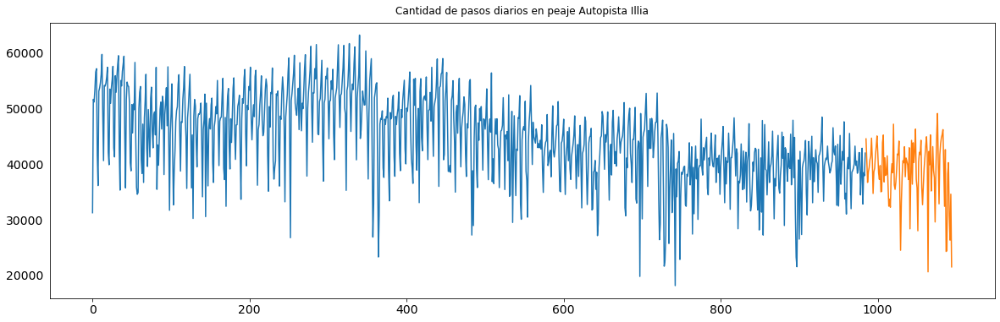

In [77]:
train.plot()
test.plot(figsize=(20, 6), 
            title= 'Cantidad de pasos diarios en peaje Autopista Illia',
            fontsize=14);

Para generar este modelo, se empleará la siguiente función almacenada en GitHub (fuente: https://pawarbi.github.io/blog/forecasting/r/python/rpy2/altair/fbprophet/ensemble_forecast/uncertainty/simulation/2020/04/21/timeseries-part2.html#Ensemble-Forecasts), para la implementación de un modelo de este tipo, llamado *seasonal naïve*.

In [78]:
def pysnaive(train_series,seasonal_periods,forecast_horizon):
    '''
    Python implementation of Seasonal Naive Forecast. 
    This should work similar to https://otexts.com/fpp2/simple-methods.html
    Returns two arrays
     > fitted: Values fitted to the training dataset
     > fcast: seasonal naive forecast
    
    Author: Sandeep Pawar
    
    Date: Apr 9, 2020
    
    Ver: 1.0
    
    train_series: Pandas Series
        Training Series to be used for forecasting. This should be a valid Pandas Series. 
        Length of the Training set should be greater than or equal to number of seasonal periods
        
    Seasonal_periods: int
        No of seasonal periods
        Yearly=1
        Quarterly=4
        Monthly=12
        Weekly=52
        

    Forecast_horizon: int
        Number of values to forecast into the future
    
    e.g. 
    fitted_values = pysnaive(train,12,12)[0]
    fcast_values = pysnaive(train,12,12)[1]
    '''
    
    if len(train_series)>= seasonal_periods: #checking if there are enough observations in the training data
        
        last_season=train_series.iloc[-seasonal_periods:]
        
        reps=np.int(np.ceil(forecast_horizon/seasonal_periods))
        
        fcarray=np.tile(last_season,reps)
        
        fcast=pd.Series(fcarray[:forecast_horizon])
        
        fitted = train_series.shift(seasonal_periods)
        
    else:
        fcast=print("Length of the trainining set must be greater than number of seasonal periods") 
    
    return fitted, fcast

En este modelo, debemos indicar qué período tomar como referencia de fluctuación estacional, es decir, para predecir el valor que tomará la variable a tiempo *t*, a cuántos días en el pasado deberemos remitirnos para efectuar la predicción. Esto lógicamente tiene una implicancia a nivel de cuántos períodos hacia adelante puedo predecir ya que, en caso de elegir como período estacional 7 días, no se podrá predecir la variable más allá de 7 días en el futuro (para el día 8 no habrá aún un registro, a menos que se tome como cierto el valor calculado para los días precedentes).

Como primera aproximación, se elige un período estacional de 364 días (se elige 364 días en lugar de un año, para que el retraso coincida con el mismo día de la semana del período anterior). Teniendo en cuenta que ya se observó que la serie muestra una tendencia a la baja, este modelo presentará serias limitaciones en su capacidad predictiva, ya que por lo general tenderá a predecir valores de circulación de vehículos mayores a los registrados.

In [79]:
predictions=test.copy()
predictions=pd.DataFrame(predictions)

#Valores de entrenamiento ajustados
seasonal_naive_fit = pysnaive(train, 
                     seasonal_periods=364,
                     forecast_horizon=110)[0]

#Predicciones
seasonal_naive_pred = pysnaive(train, 
                     seasonal_periods=364,
                     forecast_horizon=110)[1]

#Residuos
seasonal_naive_resid = (train - seasonal_naive_fit).dropna()

predictions["seasonal_naive"] = seasonal_naive_pred.values 

En la siguiente figura, se muestran los datos de entrenamiento y el ajuste por *seasonal naïve*. Para el primer período de 365 días, dado que no se puede obtener los registros para t-365 días, no puede efectuarse el ajuste. 

(0.0, 990.0)

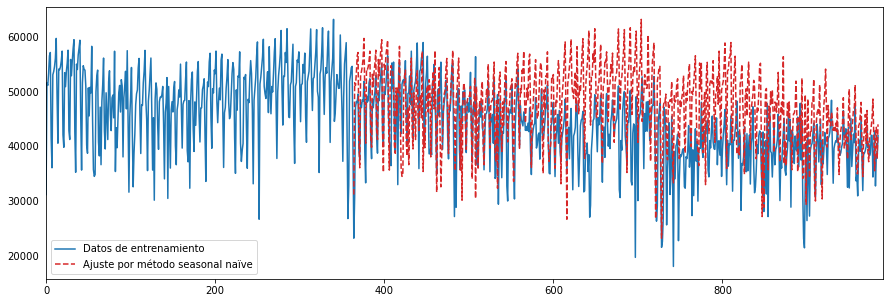

In [80]:
train.plot(figsize=(15,5), color="tab:blue", legend=True, label="Datos de entrenamiento")
seasonal_naive_fit.plot(color='tab:red', style='--', legend=True, label="Ajuste por método seasonal naïve")
plt.xlim(0,990)

La siguiente figura muestra los datos de testeo, y las correspondientes predicciones. Se calcula el MAPE (error porcentual medio absoluto) y el RMSE (error cuadrático medio) como métricas de error, para luego comparar con otros modelos predictivos.

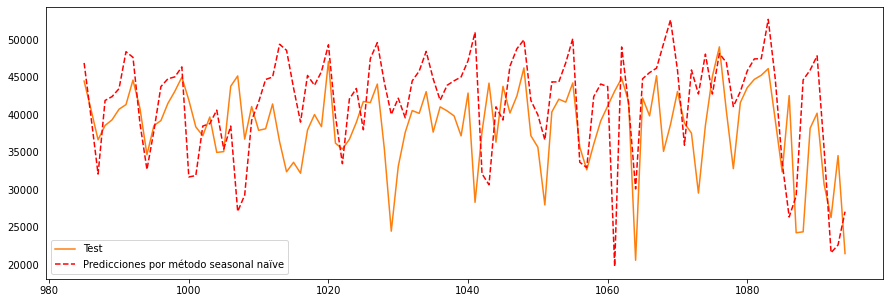

In [81]:
plt.figure(figsize = (15,5))
predictions["cantidad_pasos"].plot(color="tab:orange", legend=True, label="Test")
predictions["seasonal_naive"].plot(color="red",style='--', legend=True, label="Predicciones por método seasonal naïve");

In [82]:
from statsmodels.tools.eval_measures import rmse

def accuracy(y1,y2):
    
    accuracy_df=pd.DataFrame()
    
    rms_error = np.round(rmse(y1, y2),1)
    
    map_error = np.round(np.mean(np.abs((np.array(y1) - np.array(y2)) / np.array(y1))) * 100,1)
           
    accuracy_df=accuracy_df.append({"RMSE":rms_error, "%MAPE": map_error}, ignore_index=True)
    
    return accuracy_df

In [83]:
accuracy(train.iloc[-len(seasonal_naive_fit.dropna()):], seasonal_naive_fit.dropna())

,%MAPE,RMSE
0,18.4,8836.4


In [84]:
accuracy(predictions["cantidad_pasos"], predictions["seasonal_naive"])

,%MAPE,RMSE
0,16.4,7486.7


Finalmente, se analiza si los residuos son "ruido blanco". Para ellos, se estudian distintos parámetros de los residuos, a saber: la autocorrelación, la media, la varianza y la normalidad. Si el modelo captura bien la información de la serie temporal, los residuos deberían no mostrar autocorrelación, tener media cero, mostrar una varianza constante y estar normalmente distribuidos. Con el fin de implementar este estudio, se usa la siguiente función:

In [85]:
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera

def residcheck(residuals, lags):
    """
    Function to check if the residuals are white noise. Ideally the residuals should be uncorrelated, zero mean, 
    constant variance and normally distributed. First two are must, while last two are good to have. 
    If the first two are not met, we have not fully captured the information from the data for prediction. 
    Consider different model and/or add exogenous variable. 
    
    If Ljung Box test shows p> 0.05, the residuals as a group are white noise. Some lags might still be significant. 
    
    Lags should be min(2*seasonal_period, T/5)
    
    """
    resid_mean = np.mean(residuals)
    lj_p_val = np.mean(acorr_ljungbox(x=residuals, lags=lags)[1])
    norm_p_val =  jarque_bera(residuals)[1]
    adfuller_p = adfuller(residuals)[1]
    
    fig = plt.figure(figsize=(10,8))
    layout = (2, 2)
    ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2);
    acf_ax = plt.subplot2grid(layout, (1, 0));
    kde_ax = plt.subplot2grid(layout, (1, 1));

    residuals.plot(ax=ts_ax)
    plot_acf(residuals, lags=lags, ax=acf_ax);
    sns.kdeplot(residuals);
    #[ax.set_xlim(1.5) for ax in [acf_ax, kde_ax]]
    sns.despine()
    plt.tight_layout();
    
    print("** Mean of the residuals: ", np.around(resid_mean,2))
    
    print("\n** Ljung Box Test, p-value:", np.around(lj_p_val,3), "(>0.05, Uncorrelated)" if (lj_p_val > 0.05) else "(<0.05, Correlated)")
    
    print("\n** Jarque Bera Normality Test, p_value:", np.around(norm_p_val,3), "(>0.05, Normal)" if (norm_p_val>0.05) else "(<0.05, Not-normal)")
    
    print("\n** AD Fuller, p_value:", np.around(adfuller_p,3), "(>0.05, Non-stationary)" if (adfuller_p > 0.05) else "(<0.05, Stationary)")
    
    
    
    return ts_ax, acf_ax, kde_ax

Como se ve debajo, los residuos resultantes del modelo no son ruido blanco, por lo que se debe recurrir a otro modelo para ajustar a los datos y realizar predicciones.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/stats/diagnostic.py:524: FutureWarning:

The value returned will change to a single DataFrame after 0.12 is released.  Set return_df to True to use to return a DataFrame now.  Set return_df to False to silence this warning.



** Mean of the residuals:  -5374.72

** Ljung Box Test, p-value: 0.0 (<0.05, Correlated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


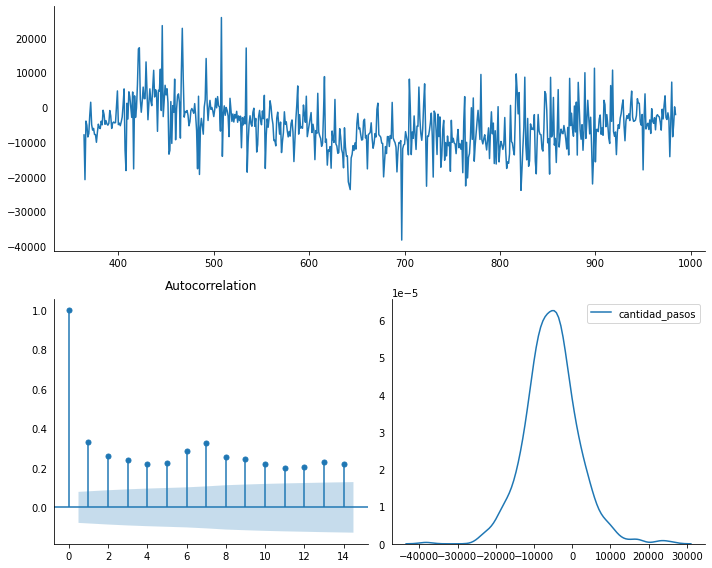

In [86]:
residcheck(seasonal_naive_resid.dropna(),14);

Finalmente, se repite el proceso con un período estacional de 7 días, que estará limitado a predecir el flujo vehicular de la próxima semana.

In [87]:
predictions2=test.copy()
predictions2=predictions2[0:7]
predictions2=pd.DataFrame(predictions2)

#Valores de entrenamiento ajustados
seasonal_naive_fit = pysnaive(train, 
                     seasonal_periods=7,
                     forecast_horizon=7)[0]

#Predicciones
seasonal_naive_pred = pysnaive(train, 
                     seasonal_periods=7,
                     forecast_horizon=7)[1]

#Residuos
seasonal_naive_resid = (train - seasonal_naive_fit).dropna()

predictions2["seasonal_naive"] = seasonal_naive_pred.values 

(0.0, 990.0)

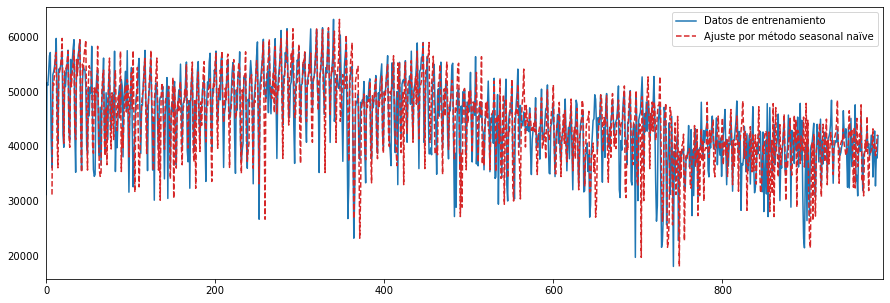

In [88]:
train.plot(figsize=(15,5), color="tab:blue", legend=True, label="Datos de entrenamiento")
seasonal_naive_fit.plot(color='tab:red', style='--', legend=True, label="Ajuste por método seasonal naïve")
plt.xlim(0,990)

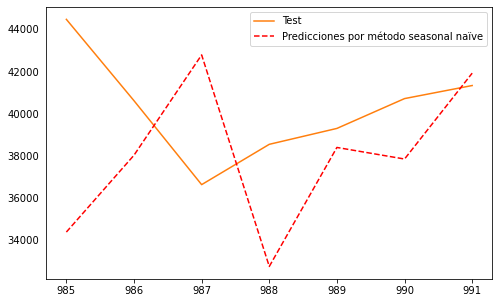

In [89]:
plt.figure(figsize = (8,5))
predictions2["cantidad_pasos"].plot(color="tab:orange", legend=True, label="Test")
predictions2["seasonal_naive"].plot(color="red",style='--', legend=True, label="Predicciones por método seasonal naïve");

Al observar las métricas de error, se puede concluir que este ajuste estacional con un período de retraso de 7 días, mejora el ajuste a los datos de entrenamiento (lo cual es lógico teniendo en cuenta que la serie muestra una tendencia a lo largo de los años).

In [90]:
accuracy(train.iloc[-len(seasonal_naive_fit.dropna()):], seasonal_naive_fit.dropna())

,%MAPE,RMSE
0,10.3,6034.8


In [91]:
accuracy(predictions2["cantidad_pasos"], predictions2["seasonal_naive"])

,%MAPE,RMSE
0,10.2,5196.5


En cuanto al análisis de residuos, este modelo demuestra ser claramente superior al anterior, pero aún no logra capturar bien la información de la serie de tiempo, al mostrar autocorrelación.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/stats/diagnostic.py:524: FutureWarning:

The value returned will change to a single DataFrame after 0.12 is released.  Set return_df to True to use to return a DataFrame now.  Set return_df to False to silence this warning.



** Mean of the residuals:  -77.97

** Ljung Box Test, p-value: 0.0 (<0.05, Correlated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


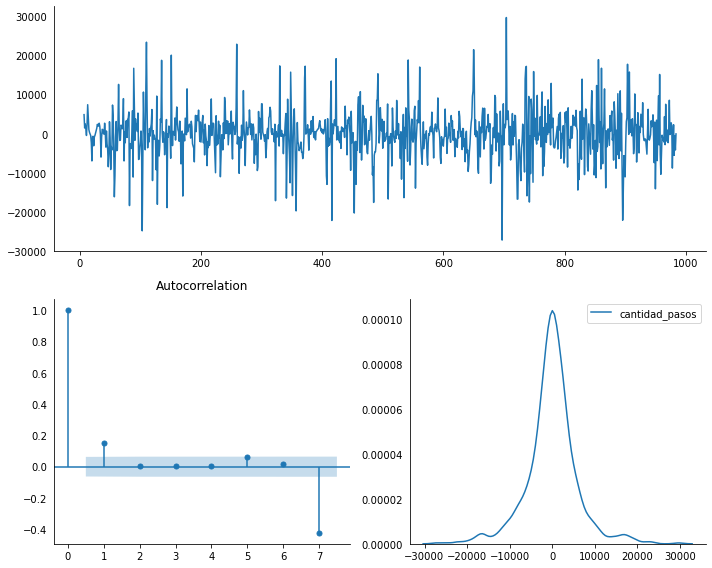

In [92]:
residcheck(seasonal_naive_resid.dropna(),7);

##### **Generación de modelo ARIMA**

A continuación, se usa la función *auto_arima()* del módulo pmdarima para encontrar el mejor modelo ARIMA para la serie de tiempo. Para encontrar el mejor ajuste, se busca los hiperparámetros que minimicen el AIC (criterio de información de Akaike), una medida de la calidad relativa del modelo estadístico que refleja un *trade-off* entre la bondad de ajuste del modelo y su complejidad, basándose en la entropía de información: ofrece una estimación relativa de la información perdida cuando se utiliza un modelo determinado para representar el proceso que genera los datos. De esta forma, se prueba con distintos valores de p, q y d para encontrar el mejor ajuste a los datos de entrenamiento y generar el modelo.

In [93]:
from pmdarima.arima import auto_arima

arima_model=auto_arima(train, 
                       start_p=1, start_q=0, max_p=5, max_d=2, max_q=5,
                       start_P=0, start_Q=0, max_P=2, max_D=2, max_Q=2, m=7,
                       seasonal=True, error_action='warn', trace=True, supress_warnings=True,
                       stepwise=False,random_state=20)

 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=20317.787, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[7] intercept   : AIC=20202.110, Time=0.17 sec
 ARIMA(0,1,0)(0,0,2)[7] intercept   : AIC=20160.234, Time=0.35 sec
 ARIMA(0,1,0)(1,0,0)[7] intercept   : AIC=20147.760, Time=0.14 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,0)(1,0,1)[7] intercept   : AIC=19885.919, Time=1.37 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,0)(1,0,2)[7] intercept   : AIC=19951.622, Time=3.09 sec
 ARIMA(0,1,0)(2,0,0)[7] intercept   : AIC=20103.213, Time=0.44 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,0)(2,0,1)[7] intercept   : AIC=19919.544, Time=3.42 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,0)(2,0,2)[7] intercept   : AIC=19969.745, Time=3.03 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=20039.093, Time=0.42 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=19853.937, Time=1.38 sec
 ARIMA(0,1,1)(0,0,2)[7] intercept   : AIC=19871.384, Time=1.29 sec
 ARIMA(0,1,1)(1,0,0)[7] intercept   : AIC=19744.471, Time=0.93 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=19527.332, Time=1.65 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,1)(1,0,2)[7] intercept   : AIC=19617.368, Time=3.00 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,1)(2,0,0)[7] intercept   : AIC=19732.135, Time=2.38 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,1)(2,0,1)[7] intercept   : AIC=19652.232, Time=7.48 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(0,1,1)(2,0,2)[7] intercept   : AIC=19707.158, Time=4.28 sec
 ARIMA(0,1,2)(0,0,0)[7] intercept   : AIC=19925.781, Time=0.32 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(0,1,2)(0,0,1)[7] intercept   : AIC=19783.886, Time=0.84 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(0,1,2)(0,0,2)[7] intercept   : AIC=19736.820, Time=2.35 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(0,1,2)(1,0,0)[7] intercept   : AIC=19709.630, Time=0.60 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(0,1,2)(1,0,1)[7] intercept   : AIC=19551.809, Time=1.97 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(0,1,2)(1,0,2)[7] intercept   : AIC=19552.032, Time=3.92 sec
 ARIMA(0,1,2)(2,0,0)[7] intercept   : AIC=19666.547, Time=1.94 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,2)(2,0,1)[7] intercept   : AIC=19552.272, Time=3.91 sec
 ARIMA(0,1,3)(0,0,0)[7] intercept   : AIC=19926.976, Time=0.49 sec
 ARIMA(0,1,3)(0,0,1)[7] intercept   : AIC=19800.174, Time=1.38 sec
 ARIMA(0,1,3)(0,0,2)[7] intercept   : AIC=19757.937, Time=2.67 sec
 ARIMA(0,1,3)(1,0,0)[7] intercept   : AIC=19733.662, Time=0.77 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,3)(1,0,1)[7] intercept   : AIC=19594.925, Time=1.90 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(0,1,3)(2,0,0)[7] intercept   : AIC=19689.526, Time=2.80 sec
 ARIMA(0,1,4)(0,0,0)[7] intercept   : AIC=19907.887, Time=0.81 sec
 ARIMA(0,1,4)(0,0,1)[7] intercept   : AIC=19796.891, Time=1.71 sec
 ARIMA(0,1,4)(1,0,0)[7] intercept   : AIC=19735.318, Time=1.29 sec
 ARIMA(0,1,5)(0,0,0)[7] intercept   : AIC=19899.942, Time=1.03 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=20275.164, Time=0.20 sec
 ARIMA(1,1,0)(0,0,1)[7] intercept   : AIC=20127.327, Time=0.24 sec
 ARIMA(1,1,0)(0,0,2)[7] intercept   : AIC=20076.617, Time=0.36 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=20047.476, Time=0.21 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=19829.949, Time=1.38 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,0)(1,0,2)[7] intercept   : AIC=19804.123, Time=2.52 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept   : AIC=19950.283, Time=1.07 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,0)(2,0,1)[7] intercept   : AIC=19801.606, Time=2.17 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,0)(2,0,2)[7] intercept   : AIC=19865.161, Time=2.79 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=19952.145, Time=0.62 sec
 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=19852.712, Time=0.71 sec
 ARIMA(1,1,1)(0,0,2)[7] intercept   : AIC=19816.038, Time=2.12 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=19720.613, Time=1.30 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=19616.488, Time=1.70 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,1)(1,0,2)[7] intercept   : AIC=19675.628, Time=4.10 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,1)(2,0,0)[7] intercept   : AIC=19644.929, Time=2.56 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(1,1,1)(2,0,1)[7] intercept   : AIC=19675.612, Time=2.69 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(1,1,2)(0,0,0)[7] intercept   : AIC=19925.851, Time=0.70 sec
 ARIMA(1,1,2)(0,0,1)[7] intercept   : AIC=19784.787, Time=1.12 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(1,1,2)(0,0,2)[7] intercept   : AIC=19737.062, Time=3.13 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(1,1,2)(1,0,0)[7] intercept   : AIC=19709.623, Time=0.94 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(1,1,2)(1,0,1)[7] intercept   : AIC=19551.400, Time=2.17 sec
 ARIMA(1,1,2)(2,0,0)[7] intercept   : AIC=19665.884, Time=2.27 sec
 ARIMA(1,1,3)(0,0,0)[7] intercept   : AIC=19910.801, Time=0.87 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(1,1,3)(0,0,1)[7] intercept   : AIC=19789.579, Time=2.68 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(1,1,3)(1,0,0)[7] intercept   : AIC=19723.943, Time=1.71 sec
 ARIMA(1,1,4)(0,0,0)[7] intercept   : AIC=19900.778, Time=0.89 sec
 ARIMA(2,1,0)(0,0,0)[7] intercept   : AIC=20197.023, Time=0.08 sec
 ARIMA(2,1,0)(0,0,1)[7] intercept   : AIC=20052.052, Time=0.17 sec
 ARIMA(2,1,0)(0,0,2)[7] intercept   : AIC=19996.110, Time=0.39 sec
 ARIMA(2,1,0)(1,0,0)[7] intercept   : AIC=19966.445, Time=0.20 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(2,1,0)(1,0,1)[7] intercept   : AIC=19780.196, Time=1.47 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(2,1,0)(1,0,2)[7] intercept   : AIC=19782.429, Time=2.54 sec
 ARIMA(2,1,0)(2,0,0)[7] intercept   : AIC=19912.473, Time=0.65 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(2,1,0)(2,0,1)[7] intercept   : AIC=19783.421, Time=3.69 sec
 ARIMA(2,1,1)(0,0,0)[7] intercept   : AIC=19935.456, Time=0.61 sec
 ARIMA(2,1,1)(0,0,1)[7] intercept   : AIC=19837.688, Time=0.99 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(2,1,1)(0,0,2)[7] intercept   : AIC=19754.999, Time=2.90 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(2,1,1)(1,0,0)[7] intercept   : AIC=19704.052, Time=1.71 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(2,1,1)(1,0,1)[7] intercept   : AIC=19670.389, Time=1.95 sec
 ARIMA(2,1,1)(2,0,0)[7] intercept   : AIC=19754.435, Time=2.80 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(2,1,2)(0,0,0)[7] intercept   : AIC=19887.172, Time=1.06 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(2,1,2)(0,0,1)[7] intercept   : AIC=19770.370, Time=2.15 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



 ARIMA(2,1,2)(1,0,0)[7] intercept   : AIC=19696.429, Time=1.57 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(2,1,3)(0,0,0)[7] intercept   : AIC=19725.582, Time=1.14 sec
 ARIMA(3,1,0)(0,0,0)[7] intercept   : AIC=20164.131, Time=0.08 sec
 ARIMA(3,1,0)(0,0,1)[7] intercept   : AIC=20011.523, Time=0.24 sec
 ARIMA(3,1,0)(0,0,2)[7] intercept   : AIC=19959.104, Time=0.43 sec
 ARIMA(3,1,0)(1,0,0)[7] intercept   : AIC=19925.226, Time=0.31 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(3,1,0)(1,0,1)[7] intercept   : AIC=19746.349, Time=1.93 sec
 ARIMA(3,1,0)(2,0,0)[7] intercept   : AIC=19876.910, Time=1.26 sec
 ARIMA(3,1,1)(0,0,0)[7] intercept   : AIC=19927.134, Time=0.55 sec
 ARIMA(3,1,1)(0,0,1)[7] intercept   : AIC=19835.373, Time=1.31 sec
 ARIMA(3,1,1)(1,0,0)[7] intercept   : AIC=19787.009, Time=1.88 sec


/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:963: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:975: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



 ARIMA(3,1,2)(0,0,0)[7] intercept   : AIC=19939.806, Time=0.99 sec
 ARIMA(4,1,0)(0,0,0)[7] intercept   : AIC=20103.862, Time=0.14 sec
 ARIMA(4,1,0)(0,0,1)[7] intercept   : AIC=19957.806, Time=0.28 sec
 ARIMA(4,1,0)(1,0,0)[7] intercept   : AIC=19871.034, Time=0.53 sec
 ARIMA(4,1,1)(0,0,0)[7] intercept   : AIC=19873.578, Time=0.42 sec
 ARIMA(5,1,0)(0,0,0)[7] intercept   : AIC=19926.501, Time=0.20 sec
Total fit time: 145.426 seconds


In [94]:
arima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                  985
Model:             SARIMAX(0, 1, 1)x(1, 0, 1, 7)   Log Likelihood               -9758.666
Date:                           Fri, 02 Oct 2020   AIC                          19527.332
Time:                                   08:52:24   BIC                          19551.790
Sample:                                        0   HQIC                         19536.635
                                           - 985                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0109      0.062      0.174      0.862      -0.112       0.133
ma.L1         -0.8886      0.013    -67.265      0.000      -0.914      -0.863
ar.S.L7        0.9998      0.000   8282.960      0.000       1.000       1.000
ma.S.L7       -0.9586      0.009   -106.841      0.000      -0.976      -0.941
sigma2      2.354e+07    4.5e-10   5.23e+16      0.000    2.35e+07    2.35e+07
===================================================================================
Ljung-Box (Q):                       63.47   Jarque-Bera (JB):               802.37
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               1.10   Skew:                            -1.12
Prob(H) (two-sided):                  0.41   Kurtosis:                         6.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.66e+32. Standard errors may be unstable.
"""

El mejor modelo ARIMA hallado para estos datos es un SARIMA(p,d,q)x(P,D,Q,m) con los siguientes parámetros:

- **p=0:** el orden del modelo de auto-regresión (AR), en donde valores del pasado predicen valores del futuro.
- **d=1:** el grado de diferenciación del modelo.
- **q=1:** el orden del modelo de media móvil (MA), que resulta de una combinación lineal de errores pasados.
- **P=1:** el orden del componente estacional del modelo de auto-regresión (AR).
- **D=0:** el orden de integración del proceso estacional.
- **Q=1:** el orden del componente estacional del modelo de media móvil (MA).
- **m=7:** el número de observaciones por ciclo estacional.


A continuación se genera el modelo de ARIMA con los hiperparámetros optimizados, y se ajusta a los datos de entrenamiento.

In [95]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarima_model=SARIMAX(endog=train, 
               order=(0,1,1),
               seasonal_order=(1,0,1,7))

sarima_fit=sarima_model.fit()

start = len(train)
end = len(train) +len(test) -1

sarima_fitted = sarima_fit.fittedvalues

sarima_resid = sarima_fit.resid

sarima = sarima_fit.predict(start, end, dynamic=False)

predictions["sarima"] = sarima

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



El método SARIMA() tiene su propia herramienta de diagnóstico de residuos. En la figura a continuación, se observa:

- gráfico de residuos estandarizados en función del tiempo: los residuos parecen estacionarios con una media que tiende a cero. Resta hacer la prueba estadística para confirmar estas observaciones.

- histograma de residuos: en verde se muestra una distribución normal de referencia, y en anaranajado se muestra la estimación de densidad que ajusta al histograma de los residuos (en azul).

- Q-Q plot: compara la distribución esperada para una distribución normal (en rojo) y la observada para los residuos (en azul). Junto con el histograma previo, parecen indicar que los residuos no muestran normalidad en su distribución.

- autocorrelograma: si bien la autocorrelación de los residuos es sensiblemente menor a la de la serie, aún se observa cierta autocorrelación de los datos.

Se concluye que los residuos no son ruido blanco.

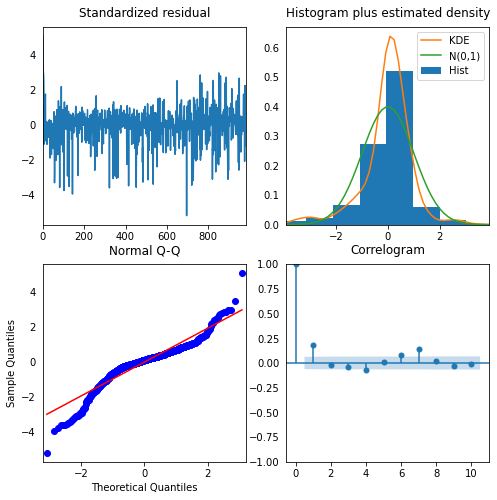

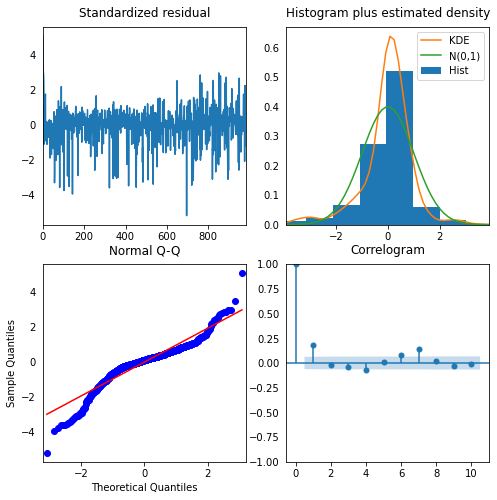

In [96]:
sarima_fit.plot_diagnostics(figsize=(8,8))

Se confirman las observaciones previas con la función previamente definida: los residuos son estacionarios, pero no muestran distribución normal, y muestran auto-correlación.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/stats/diagnostic.py:524: FutureWarning:

The value returned will change to a single DataFrame after 0.12 is released.  Set return_df to True to use to return a DataFrame now.  Set return_df to False to silence this warning.



** Mean of the residuals:  -12.54

** Ljung Box Test, p-value: 0.0 (<0.05, Correlated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


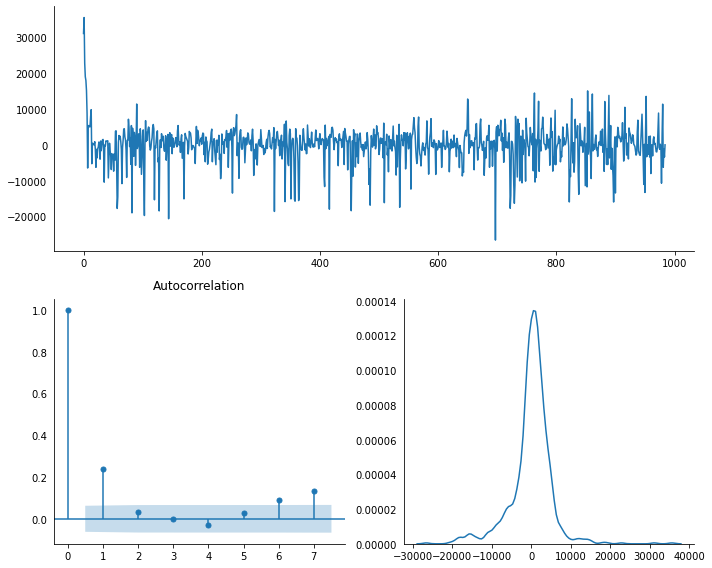

In [97]:
residcheck(sarima_resid.dropna(),7);

Se calculan las métricas de evaluación del modelo. Al comparar con los resultados obtenidos para el modelo de *seasonal naïve*, se arriba a un menor valor de MAPE y RMSE tanto para el ajuste a la serie de entrenamiento, como para las predicciones comparadas con los datos de testeo, por lo que el modelo SARIMA parece tener una mejor capacidad predictiva que el modelo benchmark.

In [98]:
accuracy(train.iloc[-len(sarima_fitted.dropna()):], sarima_fitted.dropna())

,%MAPE,RMSE
0,8.6,5192.2


In [99]:
accuracy(predictions.cantidad_pasos,predictions.sarima)

,%MAPE,RMSE
0,10.4,5038.2


Se hace una validación cruzada para verificar que la capacidad predictiva del modelo no esté asociada a esta partición de los datos en *train* y *test*. Para ello, se hace una validación cruzada con un *sliding window*, es decir, ampliando progresivamente el subset de entrenamiento, y siempre prediciendo la misma cantidad de días hacia adelante. Se observa que en líneas generales el modelo muestra un error asociado que se mantiene en distintas particiones de los datos, con excepción de dos casos, en donde el modelo no es capaz de realizar una predicción con ese error. Sin embargo, a diferencia de los casos de validación cruzada para sets de datos "convencionales", en el caso de series de tiempo puede haber ciertas seguidillas temporales en la serie que den cuenta de un error en un determinado *fold*.

In [100]:
from pmdarima.model_selection import SlidingWindowForecastCV
from pmdarima.model_selection import cross_val_score
from pmdarima import ARIMA

cv = SlidingWindowForecastCV(window_size=366, step=55, h=110)

sarima_model1 = ARIMA(order=(0, 1, 1), seasonal_order=(1, 0, 1, 7), suppress_warnings=True)

sarima_cv_scores = cross_val_score(sarima_model1, train, scoring='mean_squared_error', cv=cv, verbose=2)

resultados=sarima_cv_scores.tolist()
resultados_rmse=np.sqrt(resultados)
resultados_rmse=np.sqrt(resultados)

print("Valores de RMSE para los distintos folds de la validación cruzada: {}".format(resultados_rmse))
print("Valor promedio de RMSE",np.mean(resultados_rmse))

[CV] fold=0 ..........................................................
[CV] fold=1 ..........................................................
[CV] fold=2 ..........................................................
[CV] fold=3 ..........................................................
[CV] fold=4 ..........................................................
[CV] fold=5 ..........................................................
[CV] fold=6 ..........................................................
[CV] fold=7 ..........................................................
[CV] fold=8 ..........................................................
[CV] fold=9 ..........................................................
Valores de RMSE para los distintos folds de la validación cruzada: [26059.3808998   5442.96066877  5964.17879652 43471.96904045
  6913.38411644  6463.34784042  6529.75602727  5713.73110621
  5236.37329752  5504.02362181]
Valor promedio de RMSE 11729.91054152148


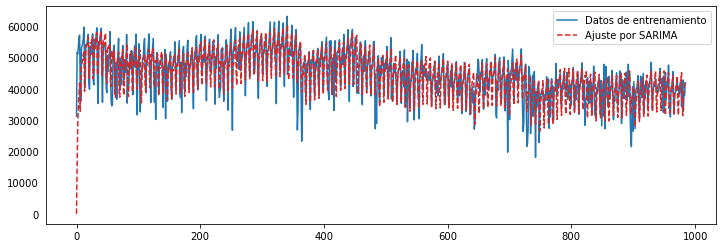

In [101]:
plt.figure(figsize=(12,4))
plt.plot(train,label='Datos de entrenamiento')
plt.plot(sarima_fitted,label='Ajuste por SARIMA',color='tab:red', ls='--')
plt.legend()
plt.show()

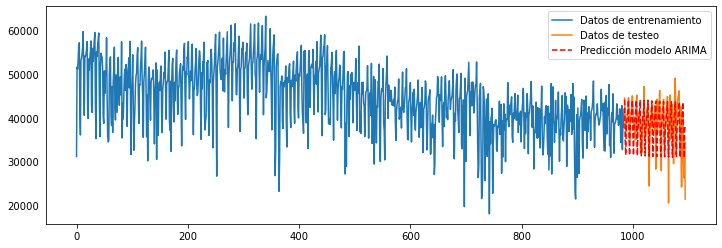

In [102]:
plt.figure(figsize=(12,4))
plt.plot(train,label='Datos de entrenamiento')
plt.plot(test,label='Datos de testeo')
plt.plot(predictions.sarima,label='Predicción modelo ARIMA',color="red",ls='--')
plt.legend()
plt.show()

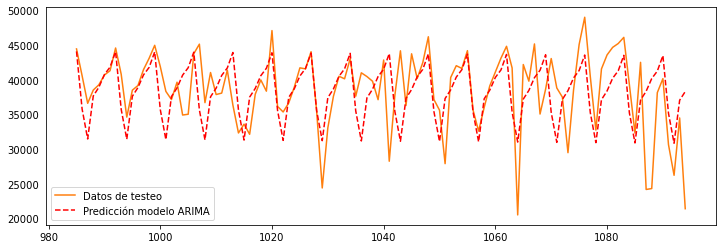

In [103]:
plt.figure(figsize=(12,4))
plt.plot(test,label='Datos de testeo',c='tab:orange')
plt.plot(predictions.sarima,label='Predicción modelo ARIMA',color="red",ls='--')
plt.legend()
plt.show()

En cuanto a las predicciones a 7 días, el RMSE resultante mostró una reducción del orden del 50% al comparar con el obtenido previamente para el modelo *seasonal naïve*. 

In [104]:
from sklearn.metrics import mean_squared_error

RMSE=mean_squared_error(predictions.cantidad_pasos[0:7], predictions.sarima[0:7],squared=False)
print('El RMSE es',RMSE,'.')

El RMSE es 2688.2333918624004 .


En forma análoga a lo efectuado anteriormente, se hace una nueva validación cruzada, pero evaluando la capacidad predictiva del modelo a 7 días. En líneas generales, se observa un comportamiento similar al descripto oportunamente para la predicción a 110 días.

In [105]:
from pmdarima.model_selection import SlidingWindowForecastCV
from pmdarima.model_selection import cross_val_score
from pmdarima import ARIMA

cv = SlidingWindowForecastCV(window_size=366, step=55, h=7)

sarima_model1 = ARIMA(order=(0, 1, 1), seasonal_order=(1, 0, 1, 7), suppress_warnings=True)

sarima_cv_scores = cross_val_score(sarima_model1, train, scoring='mean_squared_error', cv=cv, verbose=2)

resultados=sarima_cv_scores.tolist()
resultados_rmse=np.sqrt(resultados)
resultados_rmse=np.sqrt(resultados)

print("Valores de RMSE para los distintos folds de la validación cruzada: {}".format(resultados_rmse))
print("Valor promedio de RMSE",np.mean(resultados_rmse))

[CV] fold=0 ..........................................................
[CV] fold=1 ..........................................................
[CV] fold=2 ..........................................................
[CV] fold=3 ..........................................................
[CV] fold=4 ..........................................................
[CV] fold=5 ..........................................................
[CV] fold=6 ..........................................................
[CV] fold=7 ..........................................................
[CV] fold=8 ..........................................................
[CV] fold=9 ..........................................................
[CV] fold=10 .........................................................
[CV] fold=11 .........................................................
Valores de RMSE para los distintos folds de la validación cruzada: [ 8619.99350576  3168.18203915  2108.33305434  6928.43076932
  3706.91493133  601

##### **Generación de modelo con Facebook Prophet**

En primer lugar, se crea un dataframe teniendo en cuenta el formato especificado por la librería.

In [106]:
from fbprophet import Prophet

diario_fb=diario.reset_index()
diario_fb=diario_fb.drop(columns=['dia','fecha_numeros','index'])
diario_fb=diario_fb.rename(columns={'fecha':'ds','cantidad_pasos':'y'})
diario_fb

,ds,y
0,2017-01-01,31183.0
1,2017-01-02,51568.0
2,2017-01-03,51093.0
3,2017-01-04,53332.0
4,2017-01-05,56486.0
...,...,...
1090,2019-12-27,40182.0
1091,2019-12-28,30681.0
1092,2019-12-29,26259.0
1093,2019-12-30,34523.0


Se divide a los datos en *train* y *test* y se ajusta el modelo.

In [107]:
train_fb, test_fb = diario_fb.iloc[:-len(test)], diario_fb.iloc[-len(test):]
print(train_fb.shape)
print(test_fb.shape)

(985, 2)
(110, 2)


In [108]:
#Ajuste del modelo

fb1_model=Prophet(daily_seasonality=False,
                  weekly_seasonality=True,
                  yearly_seasonality=True,
                  seasonality_mode="additive").fit(train_fb)

In [109]:
#Creación de dataframe con los futuros resultados
fb1_df=fb1_model.make_future_dataframe(110, freq='D')

In [110]:
fb1_forecast_df=fb1_model.predict(fb1_df)[["ds","yhat"]]

fb1_forecast__=fb1_model.predict(fb1_df)

In [112]:
#Residuos
fb1_resid = train.values - fb1_forecast_df['yhat'].iloc[:len(train)]
fb1_forecast = fb1_forecast_df.iloc[-len(test):]

#Se agrega predicción de Facebook Prophet a dataframe de predicciones
predictions["fb1"] = fb1_forecast["yhat"].values

Se grafican a continuación los datos (puntos negros), el ajuste o predicción del modelo (línea azul) y los correspondientes intervalos de confianza para el modelo (sombra celeste).

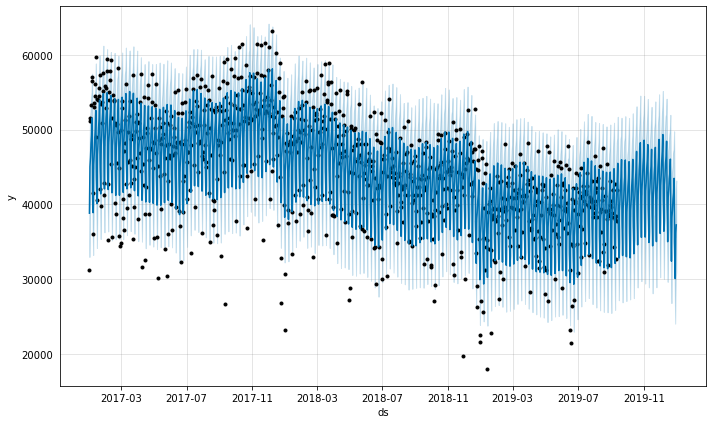

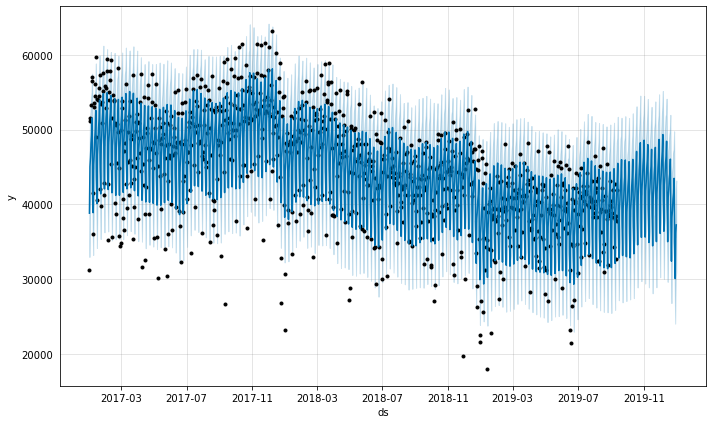

In [113]:
from fbprophet.plot import plot_plotly, plot_components_plotly

fb1_model.plot(fb1_forecast__)

Para explorar con mayor grado de detalle los ajustes a los datos de entrenamiento y las predicciones a futuro, ejecutar el siguiente código:

In [114]:
import plotly.graph_objects as go

fig1 = plot_plotly(fb1_model, fb1_forecast__)
fig1 = go.Figure(fig1)
fig1.write_html('figure_1.html', auto_open=True)

A continuación se grafican los ponentes de la serie: la tendencia, el comportamiento semanal y el comportamiento anual.

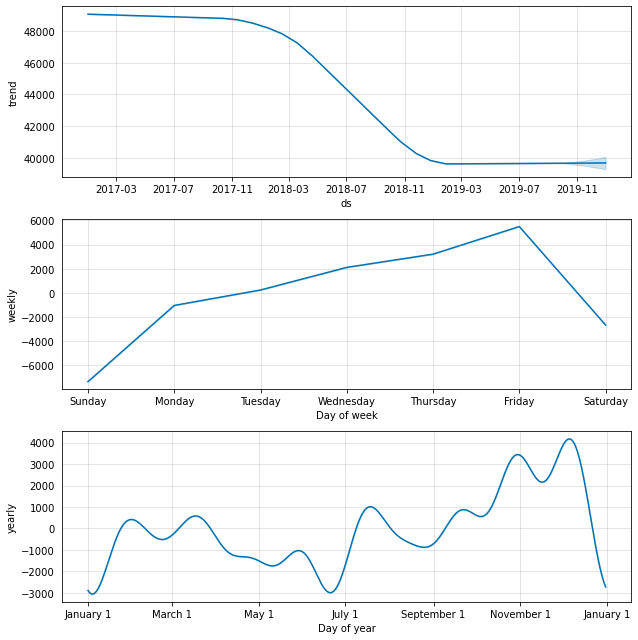

In [115]:
componentes = fb1_model.plot_components(fb1_forecast__)

Se efectúa además una validación cruzada usando esquema móvil (*rolling cross validation*), es decir, tomando como conjunto de entrenamiento un período de 366 días (superior a la estacionalidad anual de 365.25 días), y efectuando predicciones para los futuros 110 días, y calculando las métricas RMSE y MAPE para los distintos períodos de predicción.

In [116]:
from fbprophet.diagnostics import cross_validation

df_cv = cross_validation(fb1_model, initial = '366 days', horizon= '110 days')

INFO:fbprophet:Making 10 forecasts with cutoffs between 2018-01-15 00:00:00 and 2019-05-25 00:00:00


In [117]:
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2018-01-16,45619.168870,40582.432272,50676.587097,48048.0,2018-01-15
1,2018-01-17,48870.961598,43212.579907,53700.382382,48340.0,2018-01-15
2,2018-01-18,50300.970251,45013.838874,55233.586532,51548.0,2018-01-15
3,2018-01-19,52649.565442,47543.040880,58380.176332,52287.0,2018-01-15
4,2018-01-20,42870.834270,37310.055238,48276.523611,41208.0,2018-01-15
...,...,...,...,...,...,...
1095,2019-09-08,30485.367675,24547.006047,36265.728835,42777.0,2019-05-25
1096,2019-09-09,37588.513124,31884.492690,43627.829395,32750.0,2019-05-25
1097,2019-09-10,38873.591198,32592.620844,44615.751689,38391.0,2019-05-25
1098,2019-09-11,40909.143354,34909.464165,46702.327542,37842.0,2019-05-25


In [118]:
from fbprophet.diagnostics import performance_metrics

df_performance = performance_metrics(df_cv,rolling_window=0.05)
df_performance

,horizon,mse,rmse,mae,mape,mdape,coverage
0,6 days,2.062944e+07,4541.964602,3148.992884,0.077693,0.041134,0.800000
1,7 days,2.582927e+07,5082.250976,3567.400569,0.087832,0.042057,0.745455
2,8 days,2.994697e+07,5472.382258,3965.425961,0.094436,0.076736,0.718182
3,9 days,3.008901e+07,5485.345107,4069.498223,0.095066,0.076736,0.672727
4,10 days,3.493380e+07,5910.482003,4459.536529,0.105752,0.083668,0.663636
...,...,...,...,...,...,...,...
100,106 days,4.377618e+07,6616.356809,5308.948684,0.137093,0.097183,0.509091
101,107 days,3.970622e+07,6301.287554,5161.308480,0.133197,0.106181,0.563636
102,108 days,3.943061e+07,6279.379398,5091.444220,0.130860,0.114307,0.572727
103,109 days,4.451401e+07,6671.881745,5327.536547,0.132981,0.118109,0.581818


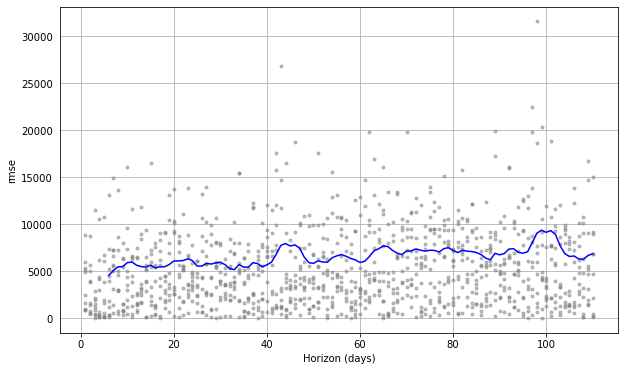

In [119]:
from fbprophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse',rolling_window=0.05)

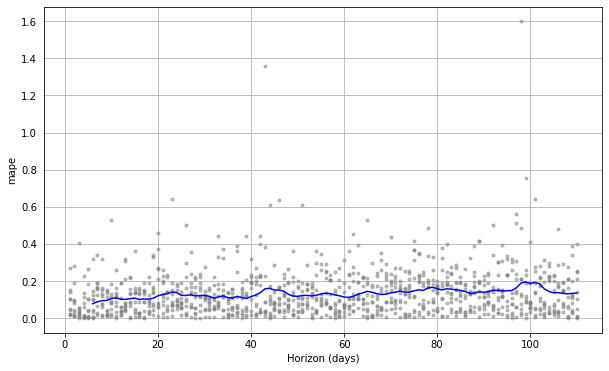

In [120]:
fig = plot_cross_validation_metric(df_cv, metric='mape',rolling_window=0.05)

En las figuras precedentes, cada punto es el error observado para cada predicción en la validación cruzada, y la línea azul muestra la métrica de error (RMSE o MAPE, respectivamente), calculada para una ventana móvil (*rolling window*). Observando estos datos, se puede concluir que el poder predictivo tiende a caer conforme aumenta el tiempo a futuro de la predicción. Por ejemplo, hay errores en torno al 10% en las predicciones a menor plazo (10-20 días), y errores que se acercan al 20% para predicciones a mayor plazo (80-100 días).

Habiendo efectuado pruebas de validación cruzada, se calculan las métricas de error para el *train* y *test*, obteniéndose un un MAPE de 8,2% y 12,5%, respectivamente. En cuanto al RMSE, se obtuvo 4.618 y 5.734, para los datos de entrenamiento y testeo, respectivamente. Por lo tanto, a pesar de ajustar mejor los datos de entrenamiento, tiene un MAPE y un RMSE mayor para la predicción del set de testeo, por lo que su poder predictivo es inferior al SARIMA.

In [121]:
accuracy(train_fb.y, fb1_forecast_df.yhat[0:985])

,%MAPE,RMSE
0,8.2,4618.1


In [122]:
accuracy(test_fb.y, fb1_forecast_df.yhat[985:1095])

,%MAPE,RMSE
0,12.5,5734.6


Una vez más, se analiza el poder predictivo de la herramienta a menor plazo, 7 días. En este caso se observa un MAPE en torno al 5% y un RMSE de aproximadamente 2280, similar al observado para el modelo SARIMA. En la validación cruzada efectuada arriba, el promedio de RMSE para una predicción a 7 días de horizonte, se situó en 5.082.

In [123]:
accuracy(test_fb.y[0:7], fb1_forecast_df.yhat[985:992])

,%MAPE,RMSE
0,5.1,2280.9


##### **Generación de modelo con árboles de decisión**

Para generar un nuevo modelo basado en árboles de decisión, se recurrirá a la generación de variables que puedan ayudar a la predicción. A la variable del día de la semana creada previamente, se le suma el mes del año. Ambas variables aportarán información de la estacionalidad del flujo vehicular. Adicionalmente, se agrega a cada registro variables con la cantidad de pasos en el día previo y los días -7, -14 y -21 (es decir, el mismo día de la semana de las semanas previas). También se suma una columna indicando si los datos del registro en cuestión corresponde a un feriado, en donde previamente se constató que suele haber menor circulación de vehículos. Para entrenar este modelo, las fechas se pasan a una sucesión temporal de 1 a n días, y luego se eliminan los registros con valores faltantes.

In [124]:
diario['mes']=diario['fecha'].dt.month

In [125]:
diario['-1 dias']=diario.cantidad_pasos.shift(periods=1)
diario['-7 dias']=diario.cantidad_pasos.shift(periods=7)
diario['-14 dias']=diario.cantidad_pasos.shift(periods=14)
diario['-21 dias']=diario.cantidad_pasos.shift(periods=21)

In [126]:
lista_feriados= ['2017-01-01','2017-02-27','2017-02-28','2017-03-27','2017-04-02','2017-04-04',
                 '2017-05-01','2017-05-25','2017-06-17','2017-06-19','2017-07-09','2017-08-21',
                 '2017-10-09','2017-11-27','2017-12-08','2017-12-25','2018-01-01','2018-02-12',
                 '2018-02-13','2018-03-24','2018-03-29','2018-03-30','2018-04-02','2018-04-30',
                 '2018-05-01','2018-05-25','2018-06-17','2018-06-20','2018-07-09','2018-08-20',
                 '2018-10-15','2018-11-19','2018-12-08','2018-12-24','2018-12-25','2018-12-31',
                 '2019-01-01','2019-03-04','2019-03-05','2019-03-24','2019-04-02','2019-04-18',
                 '2019-04-19','2019-05-01','2019-05-25','2019-06-16','2019-06-20','2019-07-08',
                 '2019-07-09','2019-08-17','2019-08-19','2019-10-12','2019-10-14','2019-11-18',
                 '2019-12-08','2019-12-25']

In [127]:
diario['fecha2']=diario.fecha.dt.strftime('%Y-%m-%d')
diario['feriado']=np.where(diario.fecha2.isin(lista_feriados),1,0)
diario=diario.drop(columns='fecha2')
diario['tiempo']=diario.index
diario=diario.dropna(axis=0)
diario

,fecha,cantidad_pasos,dia,fecha_numeros,mes,-1 dias,-7 dias,-14 dias,-21 dias,feriado,tiempo
21,2017-01-22,39804.0,6,736351,1,42057.0,40546.0,36065.0,31183.0,0,21
22,2017-01-23,53409.0,0,736352,1,39804.0,54061.0,53036.0,51568.0,0,22
23,2017-01-24,50855.0,1,736353,1,53409.0,53940.0,53601.0,51093.0,0,23
24,2017-01-25,53657.0,2,736354,1,50855.0,54468.0,54523.0,53332.0,0,24
25,2017-01-26,55105.0,3,736355,1,53657.0,55548.0,56042.0,56486.0,0,25
...,...,...,...,...,...,...,...,...,...,...,...
1090,2019-12-27,40182.0,4,737420,12,38168.0,46128.0,49027.0,38676.0,0,1090
1091,2019-12-28,30681.0,5,737421,12,40182.0,39303.0,40478.0,43076.0,0,1091
1092,2019-12-29,26259.0,6,737422,12,30681.0,32337.0,32774.0,38839.0,0,1092
1093,2019-12-30,34523.0,0,737423,12,26259.0,42531.0,41588.0,37518.0,0,1093


En forma análoga a lo realizado previamente, se hace una separación en datos de entrenamiento y testeo 90%:10%, por lo que queda un conjunto de entrenamiento con 966 registros, y 108 registros quedan como datos para testear las predicciones del modelo.

In [128]:
split = int(len(diario)*.898)
train = diario[:split]
test = diario[split:]

columnas=['dia','mes','-1 dias','-7 dias','-14 dias','-21 dias','feriado','tiempo']

X_train=train.loc[:,columnas]
y_train=train.cantidad_pasos
X_test=test.loc[:,columnas]
y_test=test.cantidad_pasos

In [129]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(964, 8)
(964,)
(110, 8)
(110,)


Se hace un *RandomForestRegressor*, ajustándolo con los datos de entrenamiento. Se efectúan las predicciones correspondientes y se grafican los resultados obtenidos. Notar que para el conjunto de datos de testeo, se hace *multi-step prediction* usando los datos predichos como *input* de registros para días subsiguientes (de esta forma se evita caer en *leaking* de información de la variable a predecir).

La primera figura muestras la serie original, disociada en colores para *train* y *test*, y las predicciones para ambos subsets de datos. La segunda figura muestras un detalle para los datos de testeo únicamente.

In [130]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train,y_train)

RandomForestRegressor(random_state=42)

In [131]:
y_train_pred=rf.predict(X_train)

y_test_pred = []

#Creo una copia de X_test para editarla en base a los resultados de las predicciones (modelo multi-step)
X_test_edit=X_test.copy()

#Comienzo la predicción con el primer registro del conjunto de testeo (el día de mañana)
x = X_test_edit.loc[985,:].values 

for i in range(y_test.shape[0]):
    y_pred = rf.predict(x.reshape(1,-1))
    
    #Se agrega la predicción a la lista de predicciones
    y_test_pred.append(y_pred)
    
    #Se imputa esta predicción para los registros de los días t+1, t+7, t+14 y t+21.
    X_test_edit.loc[985+1+i,'-1 dias']=y_pred
    X_test_edit.loc[985+7+i,'-7 dias']=y_pred
    X_test_edit.loc[985+14+i,'-14 dias']=y_pred
    X_test_edit.loc[985+21+i,'-21 dias']=y_pred
    
    #Se re-define x con los valores del día siguiente para usar como input en la sigueinte iteración
    x=X_test_edit.loc[986+i].values
    
y_test_pred = np.array(y_test_pred)

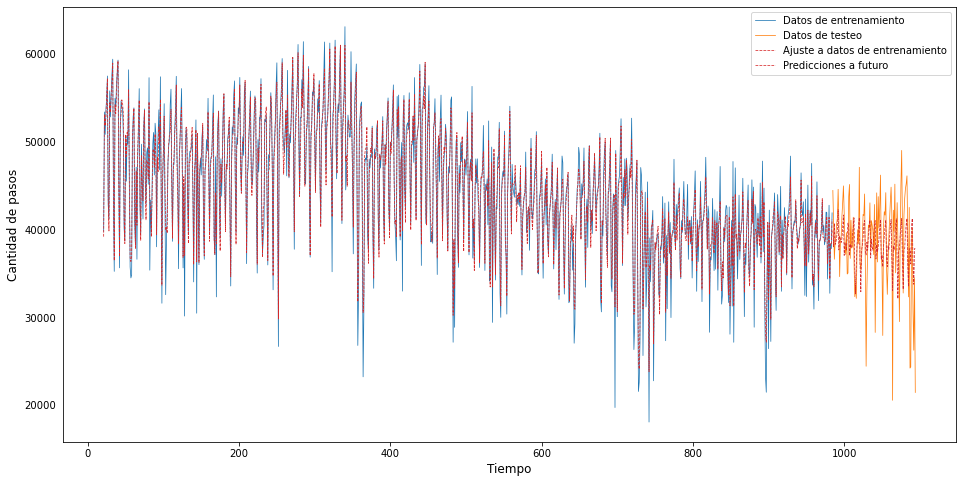

In [132]:
plt.figure(figsize=(16,8))
plt.plot(X_train.tiempo, y_train,lw = 0.75, label = 'Datos de entrenamiento',color='tab:blue')
plt.plot(X_test.tiempo, y_test,lw = 0.75, label = 'Datos de testeo',color='tab:orange')
plt.plot(X_train.tiempo,y_train_pred, lw = 0.75, label = 'Ajuste a datos de entrenamiento',color='tab:red',ls='--')
plt.plot(X_test.tiempo,y_test_pred, lw = 0.75, label = 'Predicciones a futuro',color='tab:red',ls='--')
plt.legend()
plt.xlabel('Tiempo',size='large')
plt.ylabel('Cantidad de pasos',size='large')
plt.show()

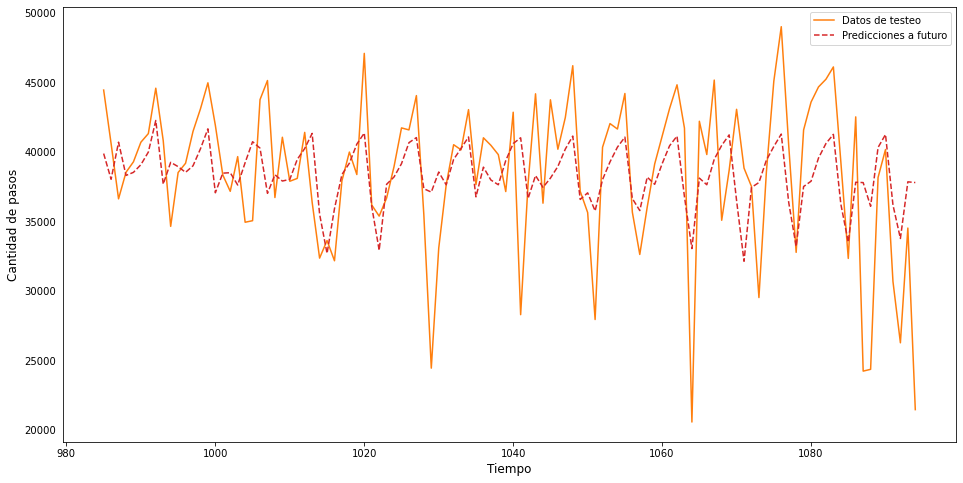

In [133]:
plt.figure(figsize=(16,8))
plt.plot(X_test.tiempo, y_test, label = 'Datos de testeo',color='tab:orange')
plt.plot(X_test.tiempo,y_test_pred, label = 'Predicciones a futuro',color='tab:red',ls='--')
plt.legend()
plt.xlabel('Tiempo',size='large')
plt.ylabel('Cantidad de pasos',size='large')
plt.show()

Se calculan las métricas de error para el ajuste a los datos de entrenamiento y de testeo. Se observa que el modelo ajusta con un error relativamente bajo a los datos de entrenamiento (en comparación con los otros modelos podría existir mayor sobreajuste). En cuanto a la capacidad predictiva a futuro (110 días en adelante), el modelo presenta un RMSE más acotado en relación al modelo base (RMSE 7.486; *benchmark* de *seasonal naïve* a 365 días). Por su parte, el modelo posee un RMSE menor al comparar con el modelo ARIMA (RMSE 5.038) y el modelo de Prophet (RMSE 5.734).

In [134]:
mean_squared_error(y_train,y_train_pred,squared=False)

1654.1038505338324

In [135]:
mean_squared_error(y_test[0:109],y_test_pred[0:109],squared=False)

4414.74619280596

En cuanto a la comparación del poder predictivo a 7 días, la métrica de error es similar a la obtenida para el modelo SARIMA (RMSE 2.688), pero superior a la del modelo de Prophet (MAPE 5,1%; RMSE 2.280).

In [136]:
mean_squared_error(y_test[0:7],y_test_pred[0:7],squared=False)

2650.6883462606665

Al estudiar qué variables tienen mayor peso para el modelo. se concluye que un 50% le corresponde al valor del tránsito vehicular del mismo día de la semana pasada (-7 días). El valor del día anterior (-1 día) y de 14 días antes (-14 días), tienen un peso en torno al 10%. El resto de las variables se reparte las importancias restantes.

A diferencia de los modelos anteriores, que sólo usaban los datos del flujo vehicular, este modelo incorpora otras variables, por lo que vale la pena un estudio particular de las importancias de las distintas variables. Además, tengo entendido que ni SARIMA ni Prophet permiten inferir la contribución relativa de algún registro predecedente para predecir un valor a futuro, motivo por el cual no fue efectuado este análisis para estos modelos.

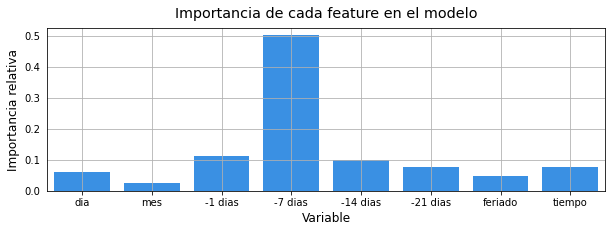

In [137]:
importancias=rf.feature_importances_
columnas=X_train.columns
plt.figure(figsize=(10,3))
sns.barplot(columnas, importancias, color="dodgerblue")
plt.title('Importancia de cada feature en el modelo',size="x-large")
plt.ylabel("Importancia relativa",size="large")
plt.xlabel("Variable",size="large")
plt.grid()
plt.show()

Por último, se realiza validación cruzada. A tal fin, recurro a una función - definida a continuación- que facilita su implementación, y que es similar a la herramienta *TimeSeriesSplit()* de Scikit Learn, pero mejora varias de sus limitaciones (obtenida en https://towardsdatascience.com/time-based-cross-validation-d259b13d42b8).

In [138]:
from datetime import datetime as dt
from dateutil.relativedelta import *

class TimeBasedCV(object):
    '''
    Parameters 
    ----------
    train_period: int
        number of time units to include in each train set
        default is 30
    test_period: int
        number of time units to include in each test set
        default is 7
    freq: string
        frequency of input parameters. possible values are: days, months, years, weeks, hours, minutes, seconds
        possible values designed to be used by dateutil.relativedelta class
        deafault is days
    '''
    
    
    def __init__(self, train_period=30, test_period=7, freq='days'):
        self.train_period = train_period
        self.test_period = test_period
        self.freq = freq

        
        
    def split(self, data, validation_split_date=None, date_column='record_date', gap=0):
        '''
        Generate indices to split data into training and test set
        
        Parameters 
        ----------
        data: pandas DataFrame
            your data, contain one column for the record date 
        validation_split_date: datetime.date()
            first date to perform the splitting on.
            if not provided will set to be the minimum date in the data after the first training set
        date_column: string, deafult='record_date'
            date of each record
        gap: int, default=0
            for cases the test set does not come right after the train set,
            *gap* days are left between train and test sets
        
        Returns 
        -------
        train_index ,test_index: 
            list of tuples (train index, test index) similar to sklearn model selection
        '''
        
        # check that date_column exist in the data:
        try:
            data[date_column]
        except:
            raise KeyError(date_column)
                    
        train_indices_list = []
        test_indices_list = []

        if validation_split_date==None:
            validation_split_date = data[date_column].min().date() + eval('relativedelta('+self.freq+'=self.train_period)')
        
        start_train = validation_split_date - eval('relativedelta('+self.freq+'=self.train_period)')
        end_train = start_train + eval('relativedelta('+self.freq+'=self.train_period)')
        start_test = end_train + eval('relativedelta('+self.freq+'=gap)')
        end_test = start_test + eval('relativedelta('+self.freq+'=self.test_period)')

        while end_test < data[date_column].max().date():
            # train indices:
            cur_train_indices = list(data[(data[date_column].dt.date>=start_train) & 
                                     (data[date_column].dt.date<end_train)].index)

            # test indices:
            cur_test_indices = list(data[(data[date_column].dt.date>=start_test) &
                                    (data[date_column].dt.date<end_test)].index)
            
            print("Train period:",start_train,"-" , end_train, ", Test period", start_test, "-", end_test,
                  "# train records", len(cur_train_indices), ", # test records", len(cur_test_indices))

            train_indices_list.append(cur_train_indices)
            test_indices_list.append(cur_test_indices)

            # update dates:
            start_train = start_train + eval('relativedelta('+self.freq+'=self.test_period)')
            end_train = start_train + eval('relativedelta('+self.freq+'=self.train_period)')
            start_test = end_train + eval('relativedelta('+self.freq+'=gap)')
            end_test = start_test + eval('relativedelta('+self.freq+'=self.test_period)')

        # mimic sklearn output  
        index_output = [(train,test) for train,test in zip(train_indices_list,test_indices_list)]

        self.n_splits = len(index_output)
        
        return index_output
    
    
    def get_n_splits(self):
        """Returns the number of splitting iterations in the cross-validator
        Returns
        -------
        n_splits : int
            Returns the number of splitting iterations in the cross-validator.
        """
        return self.n_splits 

Se hace una optimización de hiperparámetros con 100 combinaciones de número de estimadores, profundidad máxima y mínimo de muestras por hoja, incluyendo validación cruzada con 5 *folds* de la serie de tiempo.

In [139]:
tscv = TimeBasedCV(train_period=366,
                   test_period=110,
                   freq='days')

columnas=['fecha','dia','mes','-1 dias','-7 dias','-14 dias','-21 dias','feriado','tiempo']

X=diario.loc[:,columnas]
y=diario.cantidad_pasos

from sklearn.metrics import mean_squared_error
scores = []
best_rmse = 100000
best_ne = 0
best_md = 0
best_msl = 0
for ne in [5,10,25,50,100]:
    for md in [5,10,20,100]:
        for msl in [1,3,5,7,9]:
            for train_index, test_index in tscv.split(X,date_column='fecha'):
                X_train2 = X.loc[train_index].drop(columns='fecha')
                y_train2 = y.loc[train_index]

                X_test2 = X.loc[test_index].drop(columns='fecha')
                y_test2 = y.loc[test_index]
                
                rf = RandomForestRegressor(
                        n_estimators=int(ne),
                        max_depth=int(md),
                        min_samples_leaf=int(msl),
                        random_state=42)
                rf.fit(X_train2,y_train2)
                
                y_test2_pred = []
                X_test2_edit=X_test2.copy()
                x = X_test2_edit.iloc[0,:].values 

                for i in range(y_test2.shape[0]):
                    y_pred = rf.predict(x.reshape(1,-1))
                    y_test2_pred.append(y_pred)
                    
                    try:
                        X_test2_edit.iloc[1+i,2]=y_pred
                    except:
                        'IndexError'
                    try:
                        X_test2_edit.iloc[7+i,3]=y_pred
                    except:
                        'IndexError'
                    try:
                        X_test2_edit.iloc[14+i,4]=y_pred
                    except:
                        'IndexError'
                    try:
                        X_test2_edit.iloc[21+i,5]=y_pred
                    except:
                        'IndexError'                        
                    try:
                        x=X_test2_edit.iloc[1+i].values    
                    except:
                        'IndexError'
                
                y_test2_pred=np.array(y_test2_pred)
                rmse = mean_squared_error(y_test2,y_test2_pred,squared=False)
                scores.append(rmse)
                
            average_rmse = np.mean(scores)
            print('n_estimators {}, max_depth {}, min_samples {}: RMSE promedio:{}'.format(ne,md,msl,average_rmse))
            print('Valores de RMSE para cada fold:',scores)
            
            scores = []
            
            if average_rmse<best_rmse:
                best_rmse=average_rmse
                best_ne=ne
                best_md=md
                best_msl=msl       

Train period: 2017-01-22 - 2018-01-23 , Test period 2018-01-23 - 2018-05-13 # train records 366 , # test records 110
Train period: 2017-05-12 - 2018-05-13 , Test period 2018-05-13 - 2018-08-31 # train records 366 , # test records 110
Train period: 2017-08-30 - 2018-08-31 , Test period 2018-08-31 - 2018-12-19 # train records 366 , # test records 110
Train period: 2017-12-18 - 2018-12-19 , Test period 2018-12-19 - 2019-04-08 # train records 366 , # test records 110
Train period: 2018-04-07 - 2019-04-08 , Test period 2019-04-08 - 2019-07-27 # train records 366 , # test records 110
Train period: 2018-07-26 - 2019-07-27 , Test period 2019-07-27 - 2019-11-14 # train records 366 , # test records 110
n_estimators 5, max_depth 5, min_samples 1: RMSE promedio:5135.79965874939
Valores de RMSE para cada fold: [4019.5265098630894, 4035.756500871926, 5130.519692449694, 7888.9503611115, 5647.130406159336, 4092.9144820407923]
Train period: 2017-01-22 - 2018-01-23 , Test period 2018-01-23 - 2018-05-13 

Se recupera la mejor combinación de hiperparámetros medida como aquella que minimiza el RMSE resultante:

In [140]:
print('El menor RMSE promedio que se registró fue de',best_rmse)
print('Los mejores hiperparámetros parámetros resultaron n_estimators {}, max_depth {}, min_samples {}'.format(best_ne,best_md,best_msl))

El menor RMSE promedio que se registró fue de 4656.053488706033
Los mejores hiperparámetros parámetros resultaron n_estimators 50, max_depth 10, min_samples 7


En base a los resultados precedentes, se concluye que el RMSE tiende a generalizar razonablemente bien, aunque también hay algunos *folds* en donde su desempeño tiende a empeorar, aunque al parecer en menor medida al comparar con lo registrado para el modelo SARIMA.

Se genera el modelo con hiperparámetros optimizados, usando los datos de entrenamiento y testeo originalmente definidos, y se grafican los resultados.

In [141]:
rf = RandomForestRegressor(n_estimators=50, max_depth=10, min_samples_leaf=7, random_state=42)
rf.fit(X_train,y_train)
    
y_train_pred = rf.predict(X_train)

y_test_pred = []

X_test_edit=X_test.copy()
x = X_test_edit.loc[985,:].values 

for i in range(y_test.shape[0]):
    y_pred = rf.predict(x.reshape(1,-1))
    y_test_pred.append(y_pred)
    X_test_edit.loc[985+1+i,'-1 dias']=y_pred
    X_test_edit.loc[985+7+i,'-7 dias']=y_pred
    X_test_edit.loc[985+14+i,'-14 dias']=y_pred
    X_test_edit.loc[985+21+i,'-21 dias']=y_pred

    x=X_test_edit.loc[986+i].values
    
y_test_pred = np.array(y_test_pred)

predictions['random_forest']=y_test_pred

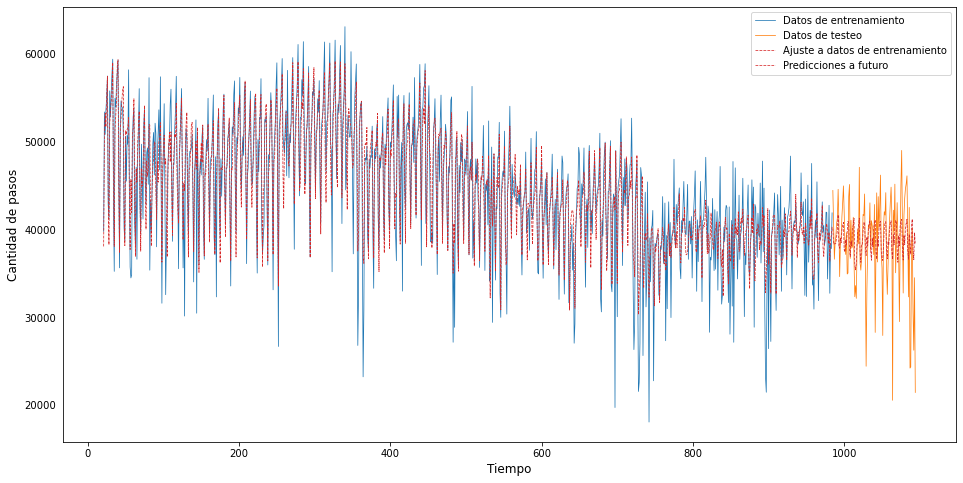

In [142]:
plt.figure(figsize=(16,8))
plt.plot(X_train.tiempo, y_train,lw = 0.75, label = 'Datos de entrenamiento',color='tab:blue')
plt.plot(X_test.tiempo, y_test,lw = 0.75, label = 'Datos de testeo',color='tab:orange')
plt.plot(X_train.tiempo,y_train_pred, lw = 0.75, label = 'Ajuste a datos de entrenamiento',color='tab:red',ls='--')
plt.plot(X_test.tiempo,y_test_pred, lw = 0.75, label = 'Predicciones a futuro',color='tab:red',ls='--')
plt.legend()
plt.xlabel('Tiempo',size='large')
plt.ylabel('Cantidad de pasos',size='large')
plt.show()

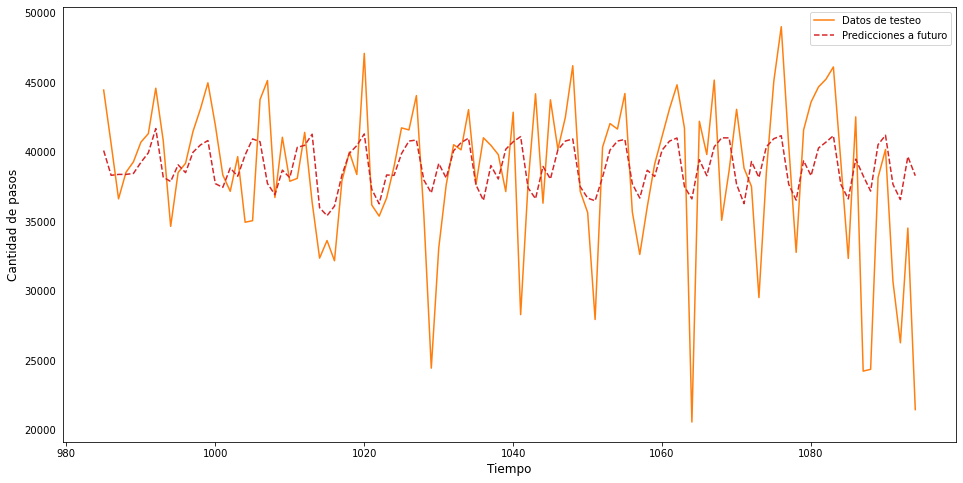

In [143]:
plt.figure(figsize=(16,8))
plt.plot(X_test.tiempo, y_test, label = 'Datos de testeo',color='tab:orange')
plt.plot(X_test.tiempo,y_test_pred, label = 'Predicciones a futuro',color='tab:red',ls='--')
plt.legend()
plt.xlabel('Tiempo',size='large')
plt.ylabel('Cantidad de pasos',size='large')
plt.show()

A continuación, se repite la validación cruzada pero con un horizonte de 7 días.

In [144]:
tscv = TimeBasedCV(train_period=366,
                   test_period=7,
                   freq='days')

columnas=['fecha','dia','mes','-1 dias','-7 dias','-14 dias','-21 dias','feriado','tiempo']

X=diario.loc[:,columnas]
y=diario.cantidad_pasos

from sklearn.metrics import mean_squared_error

scores = []
for train_index, test_index in tscv.split(X,date_column='fecha'):

    X_train3 = X.loc[train_index].drop(columns='fecha')
    y_train3 = y.loc[train_index]

    X_test3 = X.loc[test_index].drop(columns='fecha')
    y_test3 = y.loc[test_index]
    
    rf = RandomForestRegressor(n_estimators=50, max_depth=20, min_samples_leaf=7, random_state=42)
    rf.fit(X_train3,y_train3)

    y_test3_pred = []
    X_test3_edit=X_test3.copy()
    x = X_test3_edit.iloc[0,:].values 

    for i in range(y_test3.shape[0]):
        y_pred = rf.predict(x.reshape(1,-1))
        y_test3_pred.append(y_pred)
                    
        try:
            X_test3_edit.iloc[1+i,2]=y_pred
        except:
            'IndexError'
        try:
            X_test3_edit.iloc[7+i,3]=y_pred
        except:
            'IndexError'
        try:
            X_test3_edit.iloc[14+i,4]=y_pred
        except:
            'IndexError'
        try:
            X_test3_edit.iloc[21+i,5]=y_pred
        except:
            'IndexError'                        
        try:
            x=X_test3_edit.iloc[1+i].values    
        except:
            'IndexError'
            
    y_test3_pred=np.array(y_test3_pred)
    rmse = mean_squared_error(y_test3,y_test3_pred,squared=False)
    scores.append(rmse)

Train period: 2017-01-22 - 2018-01-23 , Test period 2018-01-23 - 2018-01-30 # train records 366 , # test records 7
Train period: 2017-01-29 - 2018-01-30 , Test period 2018-01-30 - 2018-02-06 # train records 366 , # test records 7
Train period: 2017-02-05 - 2018-02-06 , Test period 2018-02-06 - 2018-02-13 # train records 366 , # test records 7
Train period: 2017-02-12 - 2018-02-13 , Test period 2018-02-13 - 2018-02-20 # train records 366 , # test records 7
Train period: 2017-02-19 - 2018-02-20 , Test period 2018-02-20 - 2018-02-27 # train records 366 , # test records 7
Train period: 2017-02-26 - 2018-02-27 , Test period 2018-02-27 - 2018-03-06 # train records 366 , # test records 7
Train period: 2017-03-05 - 2018-03-06 , Test period 2018-03-06 - 2018-03-13 # train records 366 , # test records 7
Train period: 2017-03-12 - 2018-03-13 , Test period 2018-03-13 - 2018-03-20 # train records 366 , # test records 7
Train period: 2017-03-19 - 2018-03-20 , Test period 2018-03-20 - 2018-03-27 # tr

In [145]:
average_rmse = np.mean(scores)
print('Los valores de RMSE obtenidos para los distintos folds son:',scores)
print('El valor máximo de RMSE obtenido para un fold resultó de',np.amax(scores))
print('El valor mínimo de RMSE obtenido para un fold resultó de',np.amin(scores))
print('El RMSE promedio para los folds es:',average_rmse)

Los valores de RMSE obtenidos para los distintos folds son: [1985.365472531599, 3243.3807277852716, 4253.080022307971, 4371.946840961975, 6987.983742508266, 2628.259801804439, 3277.517802318144, 4227.150549880769, 4422.572591747018, 8190.691447454739, 2512.2118898346907, 4263.957053485894, 1318.351135679824, 5482.694958289321, 5717.0933985818, 2503.2318765541736, 1711.9240264656835, 4671.622952168761, 2323.2481314232655, 2871.061846241872, 4417.709036865056, 5752.81250531936, 5224.471896633275, 4950.585852938562, 5849.661359156724, 3977.565021057861, 2198.4576945887366, 2704.9094474830927, 3572.001892856696, 3678.8253996830063, 1057.5013439122586, 1893.2526981742706, 1715.9757174557553, 2783.4925986463895, 2960.7107492541777, 4216.983986185898, 6627.716068390475, 6991.708974163941, 4999.876663289738, 3524.2758173454263, 2517.8618085495364, 4662.676240220716, 3590.1142492979957, 3385.034351200915, 10019.94856028289, 5656.79539973832, 4689.839661162669, 5781.191234399527, 7783.5304526308

Se observa que el promedio de RMSE para un horizonte de 7 días resultó de 4.185 (100 particiones *train/test*), obteniéndose un valor mínimo de 1.057 y un. valor máximo 10.019, de acuerdo al *fold*. Esto es esperable, teniendo en cuenta que habrá semanas atípicas en donde la circulación tendrá un comportamiento diferente al esperable, más errático o estocástico, y otras con comportamiento más regular. En líneas generales, puede decirse que el modelo presenta una capacidad predictiva con buen poder de generalización para los distintos períodos de la serie de tiempo.

En cuanto a la compración con los otros modelos, el RMSE promedio resultante para *RandomForestRegressor* (4.185) es menor al obtenido con el modelo SARIMA (4.699) y con Prophet (5.082), por lo que se puede concluir que en líneas generales la métrica de error para *RandomForestRegressor* es menor, y sería un mejor modelo para la predicción de los datos de pasos vehiculares en el peaje de la autopista Illia.

#### **Comparación de modelos**

In [146]:
predictions.index.name='tiempo'
predictions=predictions.rename(columns={'fb1':'prophet'})
predictions.round(0)

,cantidad_pasos,seasonal_naive,sarima,prophet,random_forest
tiempo,,,,,
985,44463.0,46884.0,44114.0,45496.0,40108.0
986,40606.0,39587.0,35813.0,37432.0,38323.0
987,36628.0,32054.0,31493.0,32832.0,38388.0
988,38539.0,41877.0,37685.0,39230.0,38388.0
989,39293.0,42395.0,38937.0,40581.0,38458.0
...,...,...,...,...,...
1090,40182.0,47832.0,43502.0,43493.0,41207.0
1091,30681.0,35446.0,35201.0,35043.0,37673.0
1092,26259.0,21559.0,30880.0,30094.0,36576.0


In [147]:
forecasts = predictions.copy()
forecasts=forecasts.reset_index()
forecasts

,tiempo,cantidad_pasos,seasonal_naive,sarima,prophet,random_forest
0,985,44463.0,46884.0,44114.178904,45495.898741,40107.867818
1,986,40606.0,39587.0,35813.495424,37431.703871,38323.013163
2,987,36628.0,32054.0,31492.662119,32832.358058,38387.724591
3,988,38539.0,41877.0,37685.298200,39229.696605,38388.491562
4,989,39293.0,42395.0,38937.088830,40580.806995,38457.598031
...,...,...,...,...,...,...
105,1090,40182.0,47832.0,43501.533952,43492.803074,41207.058210
106,1091,30681.0,35446.0,35201.021204,35042.664832,37672.874533
107,1092,26259.0,21559.0,30880.276770,30094.277247,36575.750019
108,1093,34523.0,22599.0,37072.785479,36183.446142,39671.657905


In [148]:
fc_melt=pd.melt(forecasts, 
        id_vars='tiempo', 
        value_vars=['cantidad_pasos','seasonal_naive','sarima','prophet','random_forest'],
        var_name="modelo", 
        value_name="prediccion").round(0)

fc_melt.shape

(550, 3)

In [149]:
fc_melt.head()

,tiempo,modelo,prediccion
0,985,cantidad_pasos,44463.0
1,986,cantidad_pasos,40606.0
2,987,cantidad_pasos,36628.0
3,988,cantidad_pasos,38539.0
4,989,cantidad_pasos,39293.0


Se usa la librería **Altair** para generar una figura interactiva en donde puedan compararse los distintos modelos de predicción con los datos reales (fuente: https://altair-viz.github.io/gallery/multiline_tooltip.html)

In [150]:
import altair as alt

# Create a selection that chooses the nearest point & selects based on x-value
nearest = alt.selection(type='single', nearest=True, on='mouseover',
                        fields=['tiempo'], empty='none')

# The basic line
line = alt.Chart(fc_melt).mark_line(point=True).encode(
    x='tiempo',
    y=alt.Y('prediccion:Q',scale=alt.Scale(domain=[2500,55000], clamp=True)),
    color='modelo:N',
    tooltip=['tiempo','prediccion','modelo']
)

# Transparent selectors across the chart. This is what tells us
# the x-value of the cursor
selectors = alt.Chart(fc_melt).mark_point().encode(
    x='tiempo',
    opacity=alt.value(0),
).add_selection(
    nearest
)

# Draw points on the line, and highlight based on selection
points = line.mark_point().encode(
    opacity=alt.condition(nearest, alt.value(1), alt.value(0))
)

# Draw text labels near the points, and highlight based on selection
text = line.mark_text(align='left', baseline='top', dx=5, dy=-5).encode(
    text=alt.condition(nearest, 'prediccion:Q', alt.value('              '))
)
text2 = line.mark_text(align='left', baseline='bottom', dx=5, dy=-5).encode(
    text=alt.condition(nearest, 'modelo:N', alt.value('    '))
)

# Draw a rule at the location of the selection
rules = alt.Chart(fc_melt).mark_rule(color='gray').encode(
    x='tiempo',
).transform_filter(
    nearest
)

# Put the five layers into a chart and bind the data
alt.layer(
    line, selectors, points, rules, text, text2
).properties(
    width=800, height=500, title="Comparación de modelos de predicción"
).interactive()

alt.LayerChart(...)

En esta figura se observa que el modelo *seasonal_naive* tiende a desviarse significativamente de los datos de cantidad de pasos. Por su parte, Prophet, en líneas generales, tiende a sobre-estimar en gran medida el flujo vehicular en los días de mayor circulación. En cambio, los modelos de SARIMA y *random forest* parecen acompañar mejor las fluctuaciones semanales que se registran en el peaje. Tal vez, *random forest* parece ser más conservador y muestra menos oscilaciones bruscas en comparación con otros modelos y eso, por ejemplo, lo lleva a sub-estimar el tránsito que se registra en los días pico.

#### **Predicción de datos de 2020**

Por último, se intentará efectuar predicciones para el año 2020. De más está decir que por la situación sanitaria y el aislamiento social, preventivo y obligatorio, a partir de mediados de marzo habrá una merma casi total de circulación de vehículos por el peaje de la autopista Illia. De todas formas, se buscará ver cómo predice el modelo, en particular para los dos primeros meses del año.

En primer lugar, se pre-procesan los datos de manera similar a lo realizado anteriormente, incorporando en esta oportunidad los datos de 2020 obtenidos del GCBA.

In [155]:
data_2020 = pd.read_csv('Datasets/flujo-vehicular-2020.csv', sep =',')

In [156]:
filtro=data_2020.forma_pago == 'Efectivo'
data_2020.forma_pago=np.where(filtro,'EFECTIVO',data_2020.forma_pago)

In [157]:
filtro=data_2020.estacion == 'ILLIA'
data_2020.estacion=np.where(filtro,'Illia',data_2020.estacion)

In [158]:
dataset = pd.concat([data_2020, data_2019, data_2018, data_2017])
mask = np.logical_and(dataset.estacion=='Illia', dataset.forma_pago == 'EFECTIVO')
dataset = dataset[mask]

In [159]:
dataset.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion','observacion','mes','dia_fecha'], inplace = True)
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')
dataset.drop(columns=['fecha','hora_fin'], inplace = True)
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True)
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)

In [160]:
diario2 = dataset.resample('D', on = 'fecha').sum()
print(diario2.shape)
diario2.head()

(1339, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


In [161]:
diario2.reset_index(inplace=True,drop=False)

In [162]:
diario2['mes']=diario2['fecha'].dt.month
diario2['dia']=diario2['fecha'].dt.dayofweek

diario2['-1 dias']=diario2.cantidad_pasos.shift(periods=1)
diario2['-7 dias']=diario2.cantidad_pasos.shift(periods=7)
diario2['-14 dias']=diario2.cantidad_pasos.shift(periods=14)
diario2['-21 dias']=diario2.cantidad_pasos.shift(periods=21)

lista_feriados= ['2017-01-01','2017-02-27','2017-02-28','2017-03-27','2017-04-02','2017-04-04',
                 '2017-05-01','2017-05-25','2017-06-17','2017-06-19','2017-07-09','2017-08-21',
                 '2017-10-09','2017-11-27','2017-12-08','2017-12-25','2018-01-01','2018-02-12',
                 '2018-02-13','2018-03-24','2018-03-29','2018-03-30','2018-04-02','2018-04-30',
                 '2018-05-01','2018-05-25','2018-06-17','2018-06-20','2018-07-09','2018-08-20',
                 '2018-10-15','2018-11-19','2018-12-08','2018-12-24','2018-12-25','2018-12-31',
                 '2019-01-01','2019-03-04','2019-03-05','2019-03-24','2019-04-02','2019-04-18',
                 '2019-04-19','2019-05-01','2019-05-25','2019-06-16','2019-06-20','2019-07-08',
                 '2019-07-09','2019-08-17','2019-08-19','2019-10-12','2019-10-14','2019-11-18',
                 '2019-12-08','2019-12-25','2020-01-01','2020-02-24','2020-02-25']

diario2['fecha2']=diario2.fecha.dt.strftime('%Y-%m-%d')
diario2['feriado']=np.where(diario2.fecha2.isin(lista_feriados),1,0)
diario2=diario2.drop(columns='fecha2')
diario2['tiempo']=diario2.index
diario2=diario2.dropna(axis=0)
diario2

,fecha,cantidad_pasos,mes,dia,-1 dias,-7 dias,-14 dias,-21 dias,feriado,tiempo
21,2017-01-22,39804,1,6,42057.0,40546.0,36065.0,31183.0,0,21
22,2017-01-23,53409,1,0,39804.0,54061.0,53036.0,51568.0,0,22
23,2017-01-24,50855,1,1,53409.0,53940.0,53601.0,51093.0,0,23
24,2017-01-25,53657,1,2,50855.0,54468.0,54523.0,53332.0,0,24
25,2017-01-26,55105,1,3,53657.0,55548.0,56042.0,56486.0,0,25
...,...,...,...,...,...,...,...,...,...,...
1334,2020-08-27,14034,8,3,13228.0,14995.0,15896.0,15608.0,0,1334
1335,2020-08-28,14696,8,4,14034.0,15952.0,17367.0,16097.0,0,1335
1336,2020-08-29,7767,8,5,14696.0,9014.0,9594.0,8546.0,0,1336
1337,2020-08-30,5663,8,6,7767.0,5623.0,5443.0,4946.0,0,1337


A continuación, se separan los datos de 2017, 2018 y 2019 (X e y), y los datos registrados para 2020 (y_futuro). Con el modelo de *RandomForestRegressor* se calcular los valores de circulación predichos (y_pred).

In [163]:
X=diario2.iloc[0:1074]
X=X.drop(columns=['fecha','cantidad_pasos'])
y=diario2.cantidad_pasos.iloc[0:1074]

X_futuro=diario2.iloc[1074:]
X_futuro=X_futuro.drop(columns=['fecha','cantidad_pasos'])
y_futuro=diario2.cantidad_pasos.iloc[1074:]

from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=25, max_depth=10, min_samples_leaf=7, random_state=42)
rf.fit(X,y)

RandomForestRegressor(max_depth=10, min_samples_leaf=3, n_estimators=25,
                      random_state=42)

In [164]:
y_pred_lista = []

X_futuro_edit=X_futuro.copy()
x = X_futuro_edit.loc[1095,:].values

for i in range(y_futuro.shape[0]-1):
    y_pred = rf.predict(x.reshape(1,-1))
    y_pred_lista.append(y_pred)
    X_futuro_edit.loc[1095+1+i,'-1 dias']=y_pred
    X_futuro_edit.loc[1095+7+i,'-7 dias']=y_pred
    X_futuro_edit.loc[1095+14+i,'-14 dias']=y_pred
    X_futuro_edit.loc[1095+21+i,'-21 dias']=y_pred
    x=X_futuro_edit.loc[1096+i].values
    
y_pred_lista = np.array(y_pred_lista)

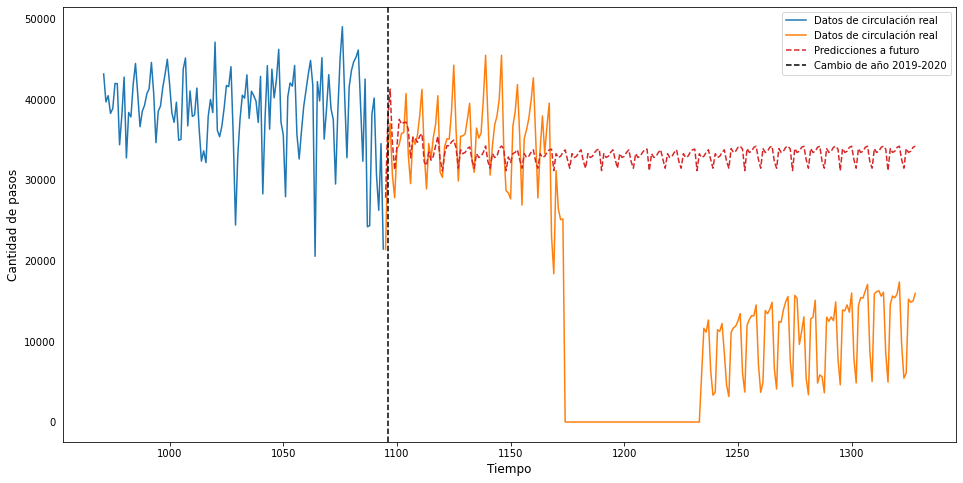

In [165]:
plt.figure(figsize=(16,8))
plt.plot(X.tiempo[950:1096], y[950:1096], label = 'Datos de circulación real',color='tab:blue')
plt.plot(X_futuro.tiempo[0:234], y_futuro[0:234], label = 'Datos de circulación real',color='tab:orange')
plt.plot(X_futuro.tiempo[0:234],y_pred_lista[0:234], label = 'Predicciones a futuro',color='tab:red',ls='--')
plt.axvline(x=1096, ymin=0, ymax=60000, color='black',ls='--',label='Cambio de año 2019-2020')
plt.legend()
plt.xlabel('Tiempo',size='large')
plt.ylabel('Cantidad de pasos',size='large')
plt.show()

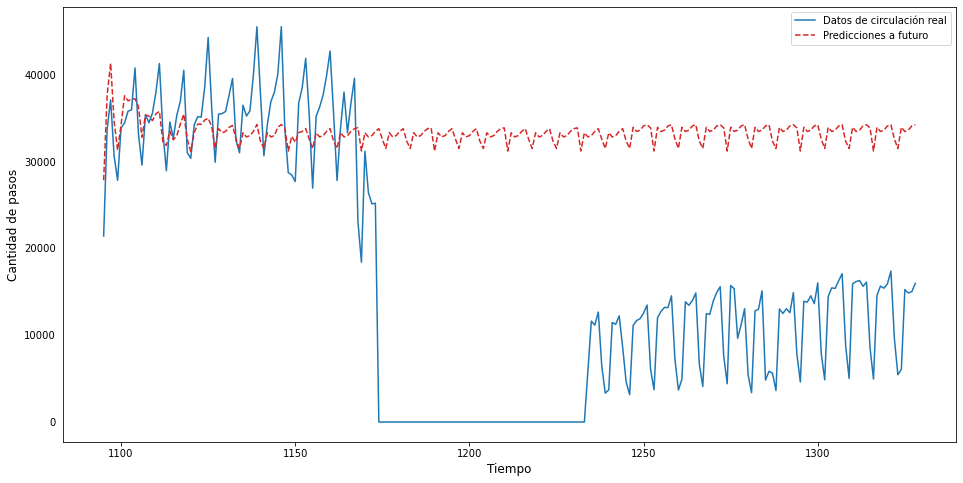

In [166]:
plt.figure(figsize=(16,8))
plt.plot(X_futuro.tiempo[0:234], y_futuro[0:234], label = 'Datos de circulación real',color='tab:blue')
plt.plot(X_futuro.tiempo[0:234],y_pred_lista[0:234], label = 'Predicciones a futuro',color='tab:red',ls='--')
plt.legend()
plt.xlabel('Tiempo',size='large')
plt.ylabel('Cantidad de pasos',size='large')
plt.show()

Se grafican los datos obtenidos. En anaranjado se muestra la circulación real registrada en 2020, mientras que en rojo intermitente se muestra la predicción por el modelo. Se constata la fuerte caída de circulación a partir de mediados de mayo al entrar el país en la cuarentena obligatoria por la pandemia. Si bien en un momento se vuelve a habilitar la circulación, esta sigue en valores muy bajos (en torno a los 10.000 vehículos) en comparación con lo esperado por el modelo. Además, hay que destacar que el modelo se optimizó para la predicción de aproximadamente 100 días en adelante (nunca antes se había visto cómo predecía para eventos más lejanos en el tiempo). Adicionalmente, considerando que es un modelo *multi-step*, se tiende a acumular el error de predicción por cada paso (es decir, en este caso, día) que se prediga.

Al concentrarnos en las predicciones pre-pandemia, se observa que el modelo sigue el patrón estacional semanal, aunque una vez más, se ratifica que el modelo de *random forest* tiende a subestimar el tránsito registrado en días con circulación pico. Además, con el paso del tiempo por acumulación de errores del modelo *multi-step*, tiende a estabilizarse en un valor, en torno al cual oscila muy poco, lo cual acrecenta el error que se registra en las predicciones. También es probable que la caída en la circulación en el último mes de diciembre introduzca mayor error en la predicción por parte de este modelo.

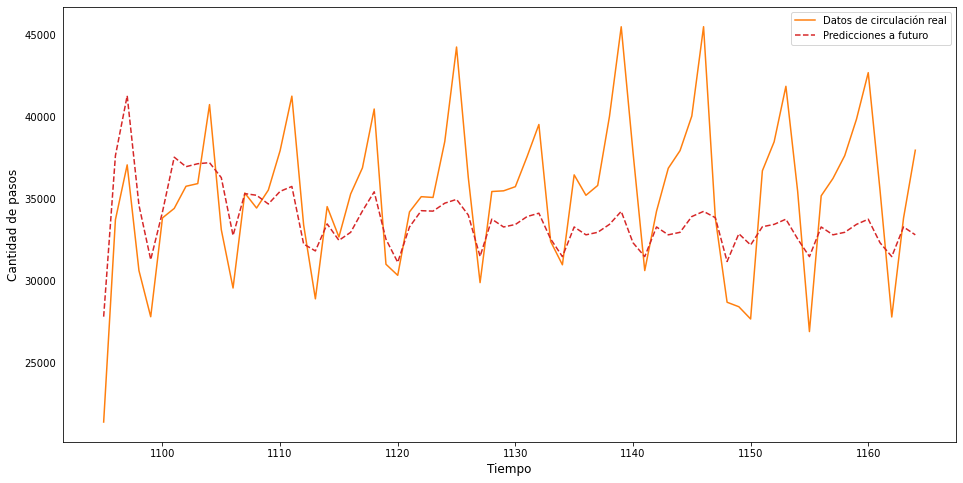

In [167]:
plt.figure(figsize=(16,8))
plt.plot(X_futuro.tiempo[0:70], y_futuro[0:70], label = 'Datos de circulación real',color='tab:orange')
plt.plot(X_futuro.tiempo[0:70],y_pred_lista[0:70], label = 'Predicciones a futuro',color='tab:red',ls='--')
plt.legend()
plt.xlabel('Tiempo',size='large')
plt.ylabel('Cantidad de pasos',size='large')
plt.show()

Se calcula el RMSE para los primeros 70 días del año (antes del aislamiento social obligatorio), y se obtiene un resultado más o menos en línea con las pruebas efectuadas previamente utilizando el modelo.

In [168]:
rmse=mean_squared_error(y_futuro[0:70],y_pred_lista[0:70],squared=False)
rmse

4178.174615247468

Teniendo en cuenta que no quedé conforme con las predicciones efectuadas por el modelo de *random forest* para el año 2020, efectúo las predicciones para 2020 con el modelo SARIMA.

In [169]:
sarima_model=SARIMAX(endog=y, 
               order=(0,1,1),
               seasonal_order=(1,0,1,7))

sarima_fit2=sarima_model.fit()

start = 1095
end = 1095 + len(X_futuro) - 1

sarima_fitted2 = sarima_fit2.fittedvalues

sarima_resid2 = sarima_fit2.resid

sarima2 = sarima_fit2.predict(start, end, dynamic=False)

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:213: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:213: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/felipemartinjaworski/opt/anaconda3/envs/timeseries/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:580: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



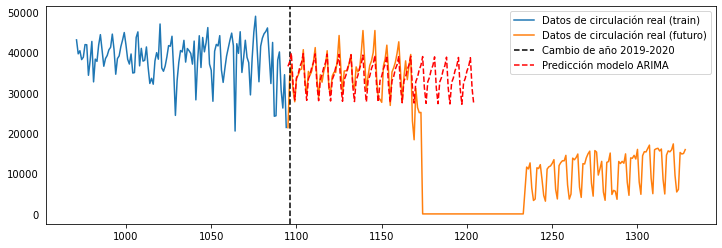

In [170]:
plt.figure(figsize=(12,4))
plt.plot(X.tiempo[950:1095], y[950:1095], label = 'Datos de circulación real (train)',color='tab:blue')
plt.plot(X_futuro.tiempo[0:234], y_futuro[0:234], label = 'Datos de circulación real (futuro)',color='tab:orange')
plt.axvline(x=1096, ymin=0, ymax=60000, color='black',ls='--',label='Cambio de año 2019-2020')
plt.plot(sarima2[0:110],label='Predicción modelo ARIMA',color="red",ls='--')
plt.legend()
plt.show()

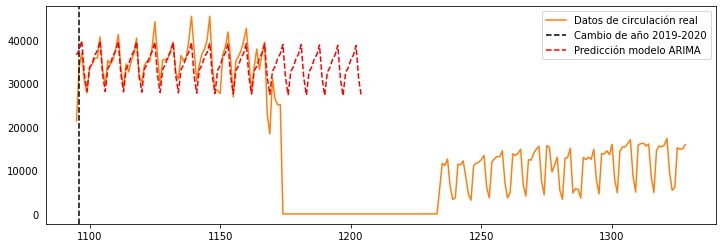

In [171]:
plt.figure(figsize=(12,4))
plt.plot(X_futuro.tiempo[0:234], y_futuro[0:234], label = 'Datos de circulación real',color='tab:orange')
plt.axvline(x=1096, ymin=0, ymax=60000, color='black',ls='--',label='Cambio de año 2019-2020')
plt.plot(sarima2[0:110],label='Predicción modelo ARIMA',color="red",ls='--')
plt.legend()
plt.show()

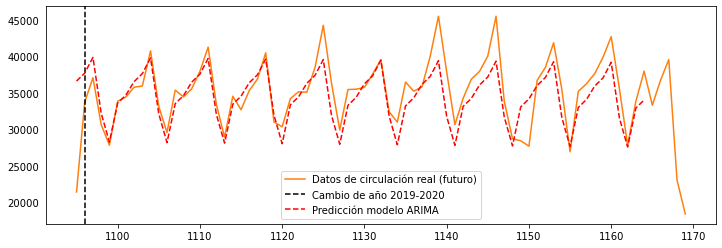

In [172]:
plt.figure(figsize=(12,4))
plt.plot(X_futuro.tiempo[0:75], y_futuro[0:75], label = 'Datos de circulación real (futuro)',color='tab:orange')
plt.axvline(x=1096, ymin=0, ymax=60000, color='black',ls='--',label='Cambio de año 2019-2020')
plt.plot(sarima2[0:70],label='Predicción modelo ARIMA',color="red",ls='--')
plt.legend()
plt.show()

Se calcula el error para los primeros 70 días de 2020, y tal como lo reflejan las figuras precedentes, se obtienen mucho mejores resultados en cuanto a las predicciones, siendo el RMSE de 3095.

In [173]:
rmse=mean_squared_error(y_futuro[0:70],sarima2[0:70],squared=False)
rmse

3095.815734998161

Por último, predigo utilizando el modelo de Prophet.

In [174]:
diario_fb2=diario2.reset_index()
diario_fb2=diario_fb2.drop(columns=['dia','index','mes','-1 dias','-7 dias','-14 dias','-21 dias','feriado','tiempo'])
diario_fb2=diario_fb2.rename(columns={'fecha':'ds','cantidad_pasos':'y'})

In [175]:
train_fb2, test_fb2 = diario_fb2.loc[:1074], diario_fb2.loc[1074:]
print(train_fb2.shape)
print(test_fb2.shape)

(1075, 2)
(244, 2)


In [176]:
fb2_model=Prophet(daily_seasonality=False,
                  weekly_seasonality=True,
                  yearly_seasonality=True,
                  seasonality_mode="additive").fit(train_fb2)

fb2_df=fb2_model.make_future_dataframe(110, freq='D')

fb2_forecast_df=fb2_model.predict(fb2_df)[["ds","yhat"]]

fb2_forecast__=fb2_model.predict(fb2_df)

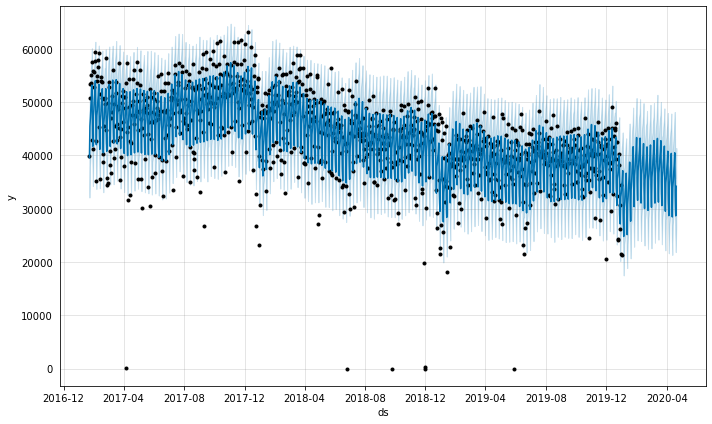

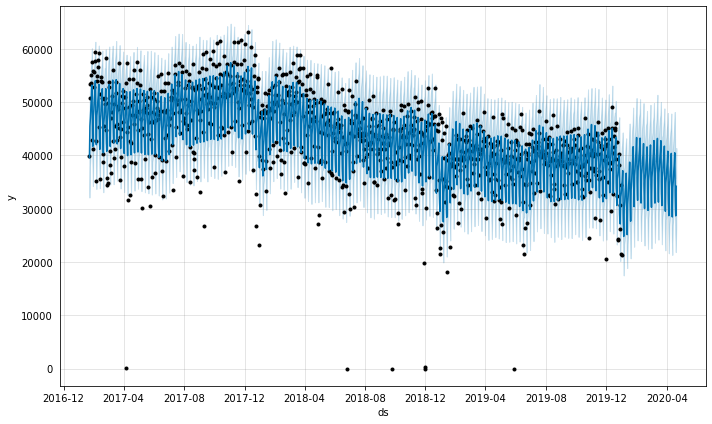

In [177]:
from fbprophet.plot import plot_plotly, plot_components_plotly

fb2_model.plot(fb2_forecast__)

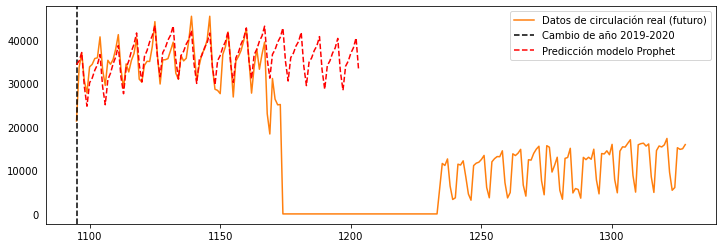

In [178]:
plt.figure(figsize=(12,4))
plt.plot(X_futuro.tiempo[0:234], y_futuro[0:234], label = 'Datos de circulación real (futuro)',color='tab:orange')
plt.axvline(x=1095, ymin=0, ymax=60000, color='black',ls='--',label='Cambio de año 2019-2020')
plt.plot(X_futuro.tiempo[0:109],fb2_forecast__.loc[1074:1182,'yhat'],label='Predicción modelo Prophet',color="red",ls='--')
plt.legend()
plt.show()

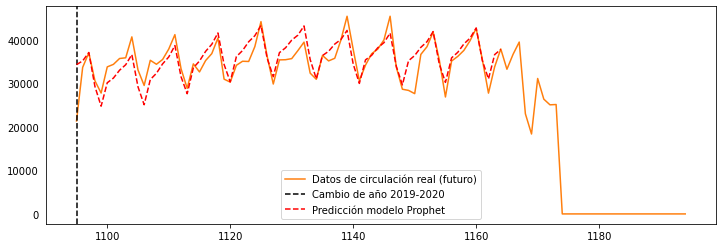

In [179]:
plt.figure(figsize=(12,4))
plt.plot(X_futuro.tiempo[0:100], y_futuro[0:100], label = 'Datos de circulación real (futuro)',color='tab:orange')
plt.axvline(x=1095, ymin=0, ymax=60000, color='black',ls='--',label='Cambio de año 2019-2020')
plt.plot(X_futuro.tiempo[0:70],fb2_forecast__.loc[1074:1143,'yhat'],label='Predicción modelo Prophet',color="red",ls='--')
plt.legend()
plt.show()

Se calcula el RMSE para la predicción en los primeros 70 días de 2020. El valor de 3.065 resultó casi idéntico al obtenido con el modelo SARIMA (RMSE 3.095)

In [180]:
rmse=mean_squared_error(y_futuro[0:70],fb2_forecast__.loc[1074:1143,'yhat'],squared=False)
rmse

3065.754056408132

Puede concluirse entonces que los modelos que mejor predicen el comportamiento del tránsito en el peaje de la autopista Illia en los primeros meses de 2020 son el modelo SARIMA (RMSE 3.095) y el de Prophet (RMSE 3.065). Más atrás en cuanto a su desempeño quedan las predicciones del modelo de *random forest* (RMSE 4.178). Esto último resulta llamativo teniendo en cuenta que cuando previamente se generó el modelo con los datos de 2016, 2017 y 2018 haciendo validación cruzada, mostró los mejores resultados en comparación con los otros dos. Es probable, sin embargo, que esto esté relacionado a que el modelo de *random forest* muestre una peor performance en particular en la predicción de este período del año. Por ejemplo, para la validación cruzada utilizando los parámetros óptimos que finalmente se eligieron, se obtuvieron los siguientes resultados, resaltándose en negrita el resultado para el período incluyendo enero.

#### n_estimators 50, max_depth 10, min_samples 9: RMSE promedio:4714.087329147774

Train period: 2017-01-22 - 2018-01-23 , Test period 2018-01-23 - 2018-05-13 # train records 366 , # test records 110. RMSE 4.734

Train period: 2017-05-12 - 2018-05-13 , Test period 2018-05-13 - 2018-08-31 # train records 366 , # test records 110. RMSE 3.993

Train period: 2017-08-30 - 2018-08-31 , Test period 2018-08-31 - 2018-12-19 # train records 366 , # test records 110. RMSE 4.789

**Train period: 2017-12-18 - 2018-12-19 , Test period 2018-12-19 - 2019-04-08 # train records 366 , # test records 110. RMSE 6.213**

Train period: 2018-04-07 - 2019-04-08 , Test period 2019-04-08 - 2019-07-27 # train records 366 , # test records 110. RSME 4682

Train period: 2018-07-26 - 2019-07-27 , Test period 2019-07-27 - 2019-11-14 # train records 366 , # test records 110. RMSE 3870

Puede observarse que en el *fold* que contiene este período, el RMSE es significativamente mayor al resto. Esto no sólo sucede para el modelo con estos hiperparámetros, sino que también sucede en los otros casos. Por ejemplo:

#### n_estimators 100, max_depth 100, min_samples 1: RMSE promedio:5012.098853199605

Train period: 2017-01-22 - 2018-01-23 , Test period 2018-01-23 - 2018-05-13 # train records 366 , # test records 110. RMSE 4.630

Train period: 2017-05-12 - 2018-05-13 , Test period 2018-05-13 - 2018-08-31 # train records 366 , # test records 110. RMSE 4.558

Train period: 2017-08-30 - 2018-08-31 , Test period 2018-08-31 - 2018-12-19 # train records 366 , # test records 110. RMSE 4.580.

**Train period: 2017-12-18 - 2018-12-19 , Test period 2018-12-19 - 2019-04-08 # train records 366 , # test records 110. RMSE 7.084**

Train period: 2018-04-07 - 2019-04-08 , Test period 2019-04-08 - 2019-07-27 # train records 366 , # test records 110. RMSE 5.331

Train period: 2018-07-26 - 2019-07-27 , Test period 2019-07-27 - 2019-11-14 # train records 366 , # test records 110. RMSE 3.877

#### n_estimators 100, max_depth 5, min_samples 1: RMSE promedio:5089.1434793439275

Train period: 2017-01-22 - 2018-01-23 , Test period 2018-01-23 - 2018-05-13 # train records 366 , # test records 110. RMSE 4.985

Train period: 2017-05-12 - 2018-05-13 , Test period 2018-05-13 - 2018-08-31 # train records 366 , # test records 110. RMSE 4.563

Train period: 2017-08-30 - 2018-08-31 , Test period 2018-08-31 - 2018-12-19 # train records 366 , # test records 110. RMSE 4.816

**Train period: 2017-12-18 - 2018-12-19 , Test period 2018-12-19 - 2019-04-08 # train records 366 , # test records 110. RMSE 7.499**

Train period: 2018-04-07 - 2019-04-08 , Test period 2019-04-08 - 2019-07-27 # train records 366 , # test records 110. RMSE 4.853

Train period: 2018-07-26 - 2019-07-27 , Test period 2019-07-27 - 2019-11-14 # train records 366 , # test records 110. RMSE 3.916

Por lo tanto, es probable que el modelo basado en árboles de decisión tenga una performance relativamente magra en este período en comparación con los otros dos modelos. Quizás por este motivo valga la pena efectuar predicciones con varios modelos, y quizás elegir un ensamble de modelos como el modelo más conservador, ya que podría resultar conveniente para amortizar el efecto de ciertos desvíos en las predicciones que puede tener un dado modelo en un tipo de predicción en particular.

## **Parte C: Investigación**

#### **Ensamble de modelos**

A partir de la comparación de modelos realizada anteriormen, sumado a los resultados dispares obtenidos para la predicción de los primers datos de 2020, se concluye que según la instancia que se desea predecir, un modelo puede tener un error asociado mayor o menor. Por este motivo, en esta parte del proyecto se prueba una última aproximación: el ensamble de diferentes modelos. De esta forma, se intenta minimizar el error resultante aprovechando que cada modelo tiene sus ventajas y desventajas.

He leído que hay varias formas de combinar los modelos de series de tiempo, pero que como una primera opción puede probarse simplemente el promedio o la mediana de múltiples modelos, que en muchas oportunidades termina resultando un modelo más efectivo que otros de mayor complejidad.

Combino los modelos, siendo A=*seasonal_naïve*, B=SARIMA, C=Prophet y D=*RandomForestRegressor*.

In [151]:
predictions['A_B']=predictions[['seasonal_naive','sarima']].mean(axis=1)
predictions['A_C']=predictions[['seasonal_naive','prophet']].mean(axis=1)
predictions['A_D']=predictions[['seasonal_naive','random_forest']].mean(axis=1)
predictions['A_B_C']=predictions[['seasonal_naive','sarima','prophet']].mean(axis=1)
predictions['A_B_D']=predictions[['seasonal_naive','sarima','random_forest']].mean(axis=1)
predictions['A_C_D']=predictions[['seasonal_naive','prophet','random_forest']].mean(axis=1)
predictions['A_B_C_D']=predictions[['seasonal_naive','sarima','prophet','random_forest']].mean(axis=1)
predictions['B_C']=predictions[['sarima','prophet']].mean(axis=1)
predictions['B_D']=predictions[['sarima','random_forest']].mean(axis=1)
predictions['B_C_D']=predictions[['sarima','prophet','random_forest']].mean(axis=1)
predictions['C_D']=predictions[['seasonal_naive','sarima','prophet','random_forest']].mean(axis=1)

In [152]:
rmse_A=mean_squared_error(predictions.cantidad_pasos,predictions.seasonal_naive,squared=False)
rmse_B=mean_squared_error(predictions.cantidad_pasos,predictions.sarima,squared=False)
rmse_C=mean_squared_error(predictions.cantidad_pasos,predictions.prophet,squared=False)
rmse_D=mean_squared_error(predictions.cantidad_pasos,predictions.random_forest,squared=False)
rmse_A_B_C=mean_squared_error(predictions.cantidad_pasos,predictions.A_B_C,squared=False)
rmse_A_B=mean_squared_error(predictions.cantidad_pasos,predictions.A_B,squared=False)
rmse_A_C=mean_squared_error(predictions.cantidad_pasos,predictions.A_C,squared=False)
rmse_A_D=mean_squared_error(predictions.cantidad_pasos,predictions.A_D,squared=False)
rmse_A_B_C=mean_squared_error(predictions.cantidad_pasos,predictions.A_B_C,squared=False)
rmse_A_B_D=mean_squared_error(predictions.cantidad_pasos,predictions.A_B_D,squared=False)
rmse_A_C_D=mean_squared_error(predictions.cantidad_pasos,predictions.A_C_D,squared=False)
rmse_A_B_C_D=mean_squared_error(predictions.cantidad_pasos,predictions.A_C_D,squared=False)
rmse_B_C=mean_squared_error(predictions.cantidad_pasos,predictions.B_C,squared=False)
rmse_B_D=mean_squared_error(predictions.cantidad_pasos,predictions.B_D,squared=False)
rmse_B_C_D=mean_squared_error(predictions.cantidad_pasos,predictions.B_C_D,squared=False)
rmse_C_D=mean_squared_error(predictions.cantidad_pasos,predictions.C_D,squared=False)

lista_rmse_combinaciones=[rmse_A, rmse_B, rmse_C, rmse_D,
                          rmse_A_B,rmse_A_C,rmse_A_D,rmse_A_B_C,
                          rmse_A_B_D,rmse_A_C_D,rmse_A_B_C_D, rmse_B_C,
                          rmse_B_D,rmse_B_C_D,rmse_C_D]

index=['A','B','C','D','A_B','A_C','A_D','A_B_C','A_B_D','A_C_D','A_B_C_D','B_C','B_D','B_C_D','C_D']
rmse_combinaciones=pd.DataFrame(lista_rmse_combinaciones, index=index)
rmse_combinaciones.columns=['combinacion']

In [153]:
rmse_combinaciones

,combinacion
A,7486.665164
B,5038.192739
C,5734.602112
D,4832.830784
A_B,5526.999636
A_C,6187.737752
A_D,5326.504228
A_B_C,5427.424175
A_B_D,4957.928361
A_C_D,5282.983461


Text(0.5, 0, 'Combinación de modelos')

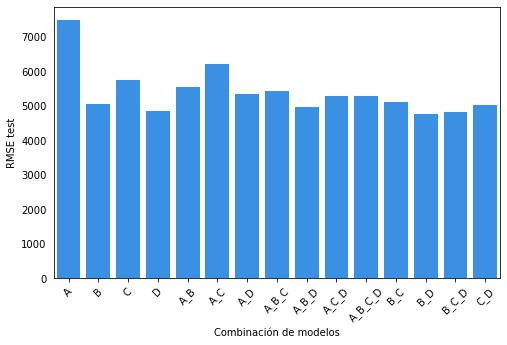

In [154]:
plt.figure(figsize=(8,5))
sns.barplot(rmse_combinaciones.index,rmse_combinaciones.combinacion,color='dodgerblue')
plt.xticks(rotation=45)
plt.ylabel('RMSE test')
plt.xlabel('Combinación de modelos')

Observando los valores de RMSE y el gráfico resultante, se concluye que la combinanción B_D entre *random forest* y SARIMA tiene un RMSE ligeramente menor. Este cambio puede no ser significativo, pero quizás la combinanción de modelos puede amortizar las limitaciones que pueda tener uno u otro modelo ante ciertos datos "díficiles" de predecir. Por lo tanto, empleo este modelo para predecir los datos de 2020. De todas formas, teniendo en cuenta que las principales desviaciones de SARIMA en 2020 eran la sub-estimación del flujo de tránsito en días con pico de circulación, y teniendo en cuenta que *random forest* muestra una tendencia a oscilar poco alrededor de una media, es esperable que una combinanción entre estos modelos, al menos para el período 2020, no arroje mejores resultados que el correspondiente al SARIMA.

In [205]:
predictions_2020 = pd.DataFrame()
predictions_2020['sarima'] = sarima2[0:243]
predictions_2020['rf'] = y_pred_lista[0:243]
predictions_2020['ensamble'] = predictions_2020[['sarima','rf']].mean(axis=1)
predictions_2020['cantidad_pasos'] = y_futuro[0:243]

In [206]:
predictions_2020

,sarima,rf,ensamble,cantidad_pasos
1095,36596.142439,27816.355254,32206.248846,21395
1096,37693.445419,37624.259231,37658.852325,33722
1097,39848.010213,41280.739903,40564.375058,37067
1098,32190.649507,34613.269426,33401.959467,30627
1099,28236.696229,31290.051539,29763.373884,27812
...,...,...,...,...
1333,34065.399635,33583.292520,33824.346077,13228
1334,35162.372129,34067.544035,34614.958082,14034
1335,37316.288010,34203.963720,35760.125865,14696
1336,29661.233551,33848.053450,31754.643500,7767


In [207]:
rmse=mean_squared_error(y_futuro[0:70],predictions_2020['ensamble'][0:70],squared=False)
rmse

3357.7240809558493

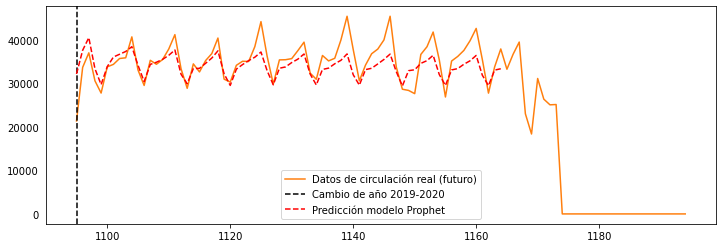

In [208]:
plt.figure(figsize=(12,4))
plt.plot(X_futuro.tiempo[0:100], y_futuro[0:100], label = 'Datos de circulación real (futuro)',color='tab:orange')
plt.axvline(x=1095, ymin=0, ymax=60000, color='black',ls='--',label='Cambio de año 2019-2020')
plt.plot(X_futuro.tiempo[0:70],predictions_2020['ensamble'][0:70],label='Predicción modelo Prophet',color="red",ls='--')
plt.legend()
plt.show()

Efectivamente, se corrobora que si bien el modelo mejora significativamente sus predicciones al comparar con las predicciones para *random forest* individual, empeora sus predicciones respecto al SARIMA.

Esta fue sólo una prueba de concepto de ensamble de modelos para predicción usando series de tiempo. Para profundizar, habría que evaluar este modelo en distintas particiones de entrenamiento y testeo. Adicionalmente, hay modelos más complejos de ensamble que podrían eventualmente ponerse a prueba con estos datos de circulación vehicular.